In [1]:
import numpy as np
import pandas as pd
import os
from pathlib import Path
import time
import glob
import re
import gc

import matplotlib
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

from dask.distributed import Client
from IPython.display import IFrame

from tqdm.notebook import tqdm

from skimage.transform import ProjectiveTransform, AffineTransform, EuclideanTransform, warp
from sklearn.linear_model import (LinearRegression,
                                  TheilSenRegressor,
                                  RANSACRegressor,
                                  HuberRegressor,
                                  RidgeCV,
                                  LassoCV)
import mrcfile

from SIFT_gs.FIBSEM_SIFT_gs import FIBSEM_frame, FIBSEM_dataset
from SIFT_gs.FIBSEM_SIFT_gs import get_min_max_thresholds
from SIFT_gs.FIBSEM_SIFT_gs import (ShiftTransform,
                                    XScaleShiftTransform,
                                    ScaleShiftTransform,
                                    RegularizedAffineTransform)
            
from SIFT_gs.FIBSEM_SIFT_gs import (generate_report_mill_rate_xlsx,
                                    generate_report_FOV_center_shift_xlsx,
                                    generate_report_data_minmax_xlsx,
                                    generate_report_ScanRate_EHT_xlsx,
                                    generate_report_transf_matrix_from_xlsx,
                                    generate_report_from_xls_registration_summary,
                                    plot_registrtion_quality_xlsx,
                                    read_kwargs_xlsx)
                        
from SIFT_gs.FIBSEM_SIFT_gs import plot_cross_sections_mrc_stack, add_scale_bar
from SIFT_gs.FIBSEM_SIFT_gs import bin_crop_mrc_stack
from SIFT_gs.FIBSEM_SIFT_gs import plot_2D_blob_results, plot_2D_blob_examples
from SIFT_gs.FIBSEM_SIFT_gs import build_kernel_FFT_zero_destreaker_XY, build_kernel_FFT_zero_destreaker_radii_angles
from SIFT_gs.FIBSEM_SIFT_gs import destreak_mrc_stack_with_kernel, smooth_mrc_stack_with_kernel

Open CV version:  4.6.0
SIFT_gs version:  4.0.1


# Set up Local DASK Client and Monitor Window

In [2]:
#start / restart client
try:
    client.restart()
except:
    client = Client()
    
# setup a window to monitor the client progress
try:
    dport = client.scheduler_info()['services']['dashboard']
except:
    dport = client.scheduler_info()['services']['bokeh']
print('Using Local Port:   ', dport)
status_update_address0 = 'http://localhost:{:d}/status'.format(dport)
print('Use ' + status_update_address0 +' to monitor DASK progress')
status_update_address = 'http://localhost:{:d}/status'.format(dport)
IFrame(src=status_update_address, width='100%', height='900px')

C:\Users\labadmin\Miniconda3\envs\sandbox\lib\site-packages\distributed\bokeh\core.py:74: UserWarning: 
Port 8787 is already in use. 
Perhaps you already have a cluster running?
Hosting the diagnostics dashboard on a random port instead.
  warnings.warn("\n" + msg)


Using Local Port:    55924
Use http://localhost:55924/status to monitor DASK progress


# Step 0a: Select the Source Directory and Source Files.

In [3]:
fls_dir0 = os.path.normpath('Y:\Images Jeiss8\Cryo\Y2023')
fls_dir1 = os.path.normpath('Y:\Images Jeiss8\Cryo\Y2023\M10')
days1 = ['M10/D{:02d}'.format(day) for day in np.arange(21, 32)]
fls_dir2 = os.path.normpath('Y:\Images Jeiss8\Cryo\Y2023\M11')
days2 = ['M11/D{:02d}'.format(day) for day in np.arange(1, 23)]

days = days1+days2
days

['M10/D21',
 'M10/D22',
 'M10/D23',
 'M10/D24',
 'M10/D25',
 'M10/D26',
 'M10/D27',
 'M10/D28',
 'M10/D29',
 'M10/D30',
 'M10/D31',
 'M11/D01',
 'M11/D02',
 'M11/D03',
 'M11/D04',
 'M11/D05',
 'M11/D06',
 'M11/D07',
 'M11/D08',
 'M11/D09',
 'M11/D10',
 'M11/D11',
 'M11/D12',
 'M11/D13',
 'M11/D14',
 'M11/D15',
 'M11/D16',
 'M11/D17',
 'M11/D18',
 'M11/D19',
 'M11/D20',
 'M11/D21',
 'M11/D22']

In [4]:
fls=[]
ftype=0
for day in days:
    fls_dir_t = os.path.join(fls_dir0, day)
    if ftype == 0:
        fls1 = sorted(glob.glob(os.path.join(fls_dir_t,'*.dat')))
        if len(fls1) < 1:
            fls1 = sorted(glob.glob(os.path.join(fls_dir_t,'*/*.dat')))
    if ftype == 1:
        fls1 = sorted(glob.glob(os.path.join(fls_dir_t,'*.tif')))
        if len(fls1) < 1:
            fls1 = sorted(glob.glob(os.path.join(fls_dir_t,'*/*.tif')))
    fls = fls + fls1

nfrs = len(fls)
print('Total Number of frames to process: ', nfrs) 

Total Number of frames to process:  5058


# Notes from Jeiss8 machine
		
10/20/2023 resume PDC-WTDN_ROI1
	3:00 pm re-aligned FIB gun head, and re-aligned all FIB apertures.
	3:40 pm resume 3D-images, tried to re-engage position, since bad milling yesterday, it was hard to locate the right position.  Manually optimized SEM image.  Need check the position and re-optimize SEM images after several milling cycles.
	
10/21/2023 continued PDC-WTDN_ROI1
	5:52 am changed CL from 5.3nA/4.2s to 5.3nA/4.5s

10/22/2023 continued PDC-WTDN_ROI1
	12:33 pm changed CL from 5.3nA/4.5s to 5.3nA/5.0s
	
10/23/2023 continued PDC-WTDN_ROI1

10/24/2023 continued PDC-WTDN_ROI1
	7:27 pm changed CL from 5.3nA/5.0s to 5.3nA/4.7s
	
10/25/2023 continued PDC-WTDN_ROI1
	11:40 pm changed CL from 5.3nA/4.7s to 5.3nA/5.0s
	23
10/26/2023 continued PDC-WTDN_ROI1

10/27/2023 continued PDC-WTDN_ROI1
	7:36 pm changed CL from 5.3nA/5.0s to 5.3nA/5.1s
	
10/28/2023 continued PDC-WTDN_ROI1

10/29/2023 continued PDC-WTDN_ROI1
	1:14 pm changed CL from 5.3nA/5.1s to 5.3nA/4.8s

10/30/2023 continued PDC-WTDN_ROI1
	7:50 pm changed CL from 5.3nA/4.8s to 5.3nA/5.0s
	
10/31/2023 continued PDC-WTDN_ROI1
	10:07 pm changed CL from 5.3nA/5.0s to 5.2nA/5.0s
	
11/01/2023 continued PDC-WTDN_ROI1

11/02/2023 continued PDC-WTDN_ROI1

11/03/2023 continued PDC-WTDN_ROI1

11/04/2023 continued PDC-WTDN_ROI1

11/05/2023 continued PDC-WTDN_ROI1
	4:43 pm changed CL from 5.2nA/5.0s to 5.1nA/5.0s
	
11/06/2023 continued PDC-WTDN_ROI1

11/07/2023 continued PDC-WTDN_ROI1
	6:29 am changed CL from 5.1nA/5.0s to 5.1nA/4.9s
	
11/08/2023 continued PDC-WTDN_ROI1
	6:26 am changed CL from 5.1nA/4.9s to 5.1nA/4.8s
	
11/09/2023 continued PDC-WTDN_ROI1
	6:19 am changed CL from 5.1nA/4.8s to 5.1nA/5.0s
	
11/10/2023 continued PDC-WTDN_ROI1
	6:39 am changed CL from 5.1nA/5.0s to 5.1nA/4.8s
	2:05 pm changed CL from 5.1nA/4.8s to 5.0nA/4.8s
	
11/11/2023 continued PDC-WTDN_ROI1

11/12/2023 continued PDC-WTDN_ROI1

11/13/2023 continued PDC-WTDN_ROI1

11/14/2023 continued PDC-WTDN_ROI1
	9:00 pm changed CL from 5.0nA/4.8s to 5.0nA/5.0s
	
11/15/2023 continued PDC-WTDN_ROI1

11/16/2023 continued PDC-WTDN_ROI1
	6:42 pm changed CL from 5.0nA/4.8s to 5.0nA/5.0s
	
11/17/2023 continued PDC-WTDN_ROI1
	9:00 am changed CL from 5.0nA/5.0s to 5.0nA/5.3s
	9:57 pm changed CL from 5.0nA/5.3s to 5.0nA/5.5s
	
11/18/2023 continued PDC-WTDN_ROI1
	8:20 am changed CL from 5.0nA/5.5s to 5.0nA/5.7s
	6:08 pm changed CL from 5.0nA/5.7s to 5.0nA/5.5s
	
11/19/2023 continued PDC-WTDN_ROI1
	6:56 am changed CL from 5.0nA/5.5s to 5.0nA/5.2s
	7:56 pm changed CL from 5.0nA/5.2s to 5.0nA/5.0s

11/20/2023 continued PDC-WTDN_ROI1

11/21/2023 continued PDC-WTDN_ROI1

11/22/2023 continued PDC-WTDN_ROI1
	6:56 am changed CL from 5.0nA/5.0s to 5.0nA/5.3s
	8:34 pm changed CL from 5.0nA/5.3s to 5.0nA/5.5s


# Step 0b: Set up Processing Parameters.

In [5]:
# set the results directory
data_dir = os.path.normpath('Y:\Images Jeiss8\Cryo\Y2023\PDC_WTDN_ROI3')

ftype = 0 # 0 for Shan's .dat files, 1 for tif files

use_DASK = True
DASK_client_retries = 3  # Number of allowed automatic retries if a task fails

threshold_min = 1e-3    # These are used to determine Min and Max data boundaries for I8 conversion
threshold_max = 1e-3                            
sliding_minmax = True   # If True, Global Min and Max for I8 conversion the entire data set is used. If False, Min and Max are allowed to vary slowly.
nbins = 256             # Number of histogram bins for determining Min and Max above

BFMatcher = False       # If True, the BF Matcher is used for keypont matching
                        # otherwise FLANN Matcher (faster, preferable) is used.

save_matches = True     # If True, matches will be saved into individual files

kp_max_num = 100000      # max number of key-points to be matched. Key-points in every frame are indexed (in descending order)
                        # by the strength of the response. Only kp_max_num is kept for further processing.
                        # Set this value to -1 if you want to keep ALL keypoints (may take forever to process!)

# Uncomment one from the below choices:
#TransformType = ShiftTransform                #  only x-shift and y-shift
#TransformType = XScaleShiftTransform          #  x-scale, x-shift, y-shift
#TransformType = ScaleShiftTransform           #  x-scale, y-scale, x-shift, y-shift
#TransformType = AffineTransform               #  full Affine (x-scale, y-scale, rotation, shear, x-shift, y-shift)
TransformType = RegularizedAffineTransform     #  full Affine (x-scale, y-scale, rotation, shear, x-shift, y-shift)
                                                # with regularization on deviation from ShiftTransform
if TransformType == RegularizedAffineTransform:
    l2_param = 1e-5                                  # regularization strength (shrinkage parameter)
    l2_matrix = np.eye(6)*l2_param                   # initially set equal shrinkage on all coefficients
    l2_matrix[2,2]=0                                 # turn OFF the regularization on shifts
    l2_matrix[5,5]=0                                 # turn OFF the regularization on shifts
    targ_vector = np.array([1, 0, 0, 0, 1, 0])       # target transformation is shift only: Sxx=Syy=1, Sxy=Syx=0
    suffix = 'l2_{:.0e}'.format(l2_matrix[0,0])
else:
    l2_matrix= None
    targ_vector = None
    suffix = 'bilin'                  # optonal characters that will be added to the end of the filename (before the extension)

SIFT_nfeatures = 0     # SIFT libary default is 0. The number of best features to retain.
                                # The features are ranked by their scores (measured in SIFT algorithm as the local contrast)
    
SIFT_nOctaveLayers = 3          # SIFT libary default  is 3. The number of layers in each octave.
                                # 3 is the value used in D. Lowe paper. The number of octaves is computed automatically from the image resolution.

SIFT_contrastThreshold = 0.025   # SIFT libary default  is 0.04. The contrast threshold used to filter out weak features in semi-uniform (low-contrast) regions.
                                # The larger the threshold, the less features are produced by the detector.
                                # The contrast threshold will be divided by nOctaveLayers when the filtering is applied.
                                # When nOctaveLayers is set to default and if you want to use the value used in
                                # D. Lowe paper (0.03), set this argument to 0.09.
                                
SIFT_edgeThreshold = 10         # SIFT libary default  is 10. The threshold used to filter out edge-like features.
                                # Note that the its meaning is different from the contrastThreshold,
                                # i.e. the larger the edgeThreshold, the less features are filtered out
                                # (more features are retained).

SIFT_sigma = 1.6                # SIFT library default is 1.6. 	The sigma of the Gaussian applied to the input image at the octave #0.
                                # If your image is captured with a weak camera with soft lenses, you might want to reduce the number.
    
Lowe_Ratio_Threshold = 0.7

solver = 'RANSAC'       # String indicating which solver is to be used.'RANSAC' will use RANSAC (Random Sample Consensus) algorithm.
                        # 'LinReg' will use Linear Regression with iterative "Throwing out the Worst Residual" Heuristic

drmax = 1.5              # dimensions - pixels.
                         #  - in the case of 'RANSAC' - Maximum distance for a data point to be classified as an inlier.
                         #  - in the case of 'LinReg' - outlier threshold for iterative regression:
                         # For each matched pair of keypoins the error is calculated as err[j] = dst_pts[j] - A*src_pts[j]
                         # The iterative procedure throws away the matched keypoint pair with worst error on every iteration
                         # until the worst error falls below drmax or the max number of iterations is reached.

max_iter = 1000             # max number of iterations in the iterative procedure above

save_data_as_tiff = False    # Convert and Save the InLens.tif data

save_res_png = True          # Save PNG images of the intemediate processing statistics and final registration quality check.

dtp = np.int16                  # Python data type for saving. Deafult is int16, the other option currently is uint8.

preserve_scales = True       # If True, the transformation matrix will be adjusted using the settings defined by fit_params below
fit_params = ['SG', 101, 3]  # perform the above adjustment using  Savitzky-Golay (SG) filter with parameters
                             # window size 501, polynomial order 3
#fit_params = ['LF']         # another option is to use linear fit with forces start points Sxx and Syy = 1 and Sxy and Syx = 0
#fit_params = ['PF', 2]      # another option is to use polynomial fit (in this case of order 2)

subtract_linear_fit = [True, True]  # If True, the linear slopes along X- and Y- directions (respectively) will be subtracted from the cumulative shifts.
                                    # This is performed after the optimal frame-to-frame shifts are recalculated for preserve_scales = True 
subtract_FOVtrend_from_fit = [True, True]  # If True, FOV trends (image shifts performed during imaging) will be subtracted first, so they do not bias the linear trends.

pad_edges = True             # If True, the edges will be padded with the amount equal to max shift excursion in each direction

flipY = False                 # If True, the dataset will be flipped along Y-direction

zbin_factor =  1             # binning factor in z-direction (milling direction). Data will be binned when saving the final result. Default is 1.

eval_metrics = ['NSAD', 'NCC', 'NMI']   # list of metrics used for evaluation of registration (and resolution).
                                        # Options are; 'NSAD', 'NCC', 'NMI', 'FSC'
fnm_types = ['mrc']    #   File type(s) for output data. Options are: ['h5', 'mrc'].
                             # Defauls is ['mrc']. 
                             # 'h5' is BigDataViewer HDF5 format, uses npy2bdv package. Use empty list if do not want to save the data.

int_order = 1                #     The order of interpolation. The order has to be in the range 0-5:
                             #    - 0: Nearest-neighbor
                             #    - 1: Bi-linear (default)
                             #    - 2: Bi-quadratic
                             #    - 3: Bi-cubic
                             #    - 4: Bi-quartic
                             #    - 5: Bi-quintic
                        
                        

#********************************************************************************************************
# DO NOT MODIFY THE CODE BELOW!
#********************************************************************************************************           

if fit_params[1] > nfrs//2*2-1:  # if smoothing aperture (Sov-Gol) is larger than number of frames, reduce the aperture
    fit_params[1] = nfrs//2*2-1

fnm0 = (os.path.join(data_dir,fls[0]))
frame0 = FIBSEM_frame(fnm0, ftype=ftype)
Sample_ID = frame0.Sample_ID.strip('\x00')
EightBit = frame0.EightBit

SIFT_kwargs = {
    'ftype' : ftype,
    'data_dir' : data_dir,
    'Sample_ID' : Sample_ID,
    'EightBit' : EightBit,
    'use_DASK' : use_DASK,
    'DASK_client_retries' : DASK_client_retries,
    'threshold_min' : threshold_min, 
    'threshold_max' : threshold_max,
    'sliding_minmax' : sliding_minmax,
    'nbins' : nbins,
    'TransformType' : TransformType,
    'SIFT_nfeatures' : SIFT_nfeatures,
    'SIFT_nOctaveLayers' : SIFT_nOctaveLayers,
    'SIFT_contrastThreshold' : SIFT_contrastThreshold,
    'SIFT_edgeThreshold' : SIFT_edgeThreshold,
    'SIFT_sigma' : SIFT_sigma,
    'Lowe_Ratio_Threshold' : Lowe_Ratio_Threshold,
    'l2_matrix' : l2_matrix,
    'targ_vector': targ_vector, 
    'solver' : solver,
    'drmax' : drmax,
    'max_iter' : max_iter,
    'BFMatcher' : BFMatcher,
    'save_matches' : save_matches,
    'kp_max_num' : kp_max_num,
    'save_res_png' : save_res_png,
    'save_data_as_tiff' : save_data_as_tiff,
    'dtp' : dtp,
    'preserve_scales' : preserve_scales,
    'fit_params' : fit_params,
    'subtract_linear_fit' : subtract_linear_fit,
    'subtract_FOVtrend_from_fit' : subtract_FOVtrend_from_fit,
    'pad_edges' : pad_edges,
    'flipY' : flipY,
    'zbin_factor' : zbin_factor,
    'eval_metrics' : eval_metrics,
    'fnm_types' : fnm_types,
    'int_order' : int_order,
    'suffix' : suffix}

test_dataset = FIBSEM_dataset(fls, fnm_reg = 'Registered_brat0.00.mrc', **SIFT_kwargs)

2024/05/14  19:46:42   Registered data will be saved into:  Registered_brat0.00.mrc
Total Number of frames:  5058


header scaling data: [[ 2.00000000e+06  2.00000000e+06]
 [-4.19401318e+03 -4.20100684e+03]
 [ 2.13223442e-01  2.65138056e-02]
 [ 1.00000000e-01  1.00000000e-01]]
2024/05/14  19:46:53   The EM data range for display:            -3452.4 - -3096.8
2024/05/14  19:46:53   The EM data range for noise analysis:     -3424.3 - -3150.3
popt:  [3.59883802e-01 1.41305097e+03]
I_array:  [-3424.27290912 -3150.27148412 -3289.22158892]
Slope of linear fit with header offset: 0.25
Var at peak: 229.3
PSNR=42.08, PSNR_header=59.75, DSNR=18.09
2024/05/14  19:47:27   results saved into the file: Y:\Images Jeiss8\Cryo\Y2023\PDC_WTDN_ROI3\Merlin-6284_23-11-03_013932_0-0-0_RawImageA_Noise_Analysis.png
2024/05/14  19:47:29   The EM data range for display:            -4415.4 - -4331.6
2024/05/14  19:47:30   The EM data range for noise analysis:     -4404.0 - -4345.9
popt:  [2.12190693e+00 9.55264076e+03]
I_array:  [-4404.01975613 -4345.8529404  -4369.69566781]
Slope of linear fit with header offset: -1.58
Var a

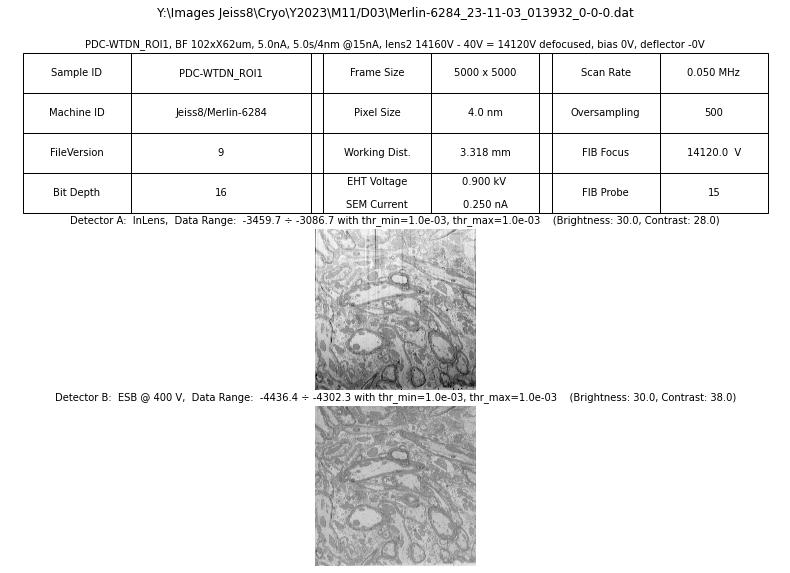

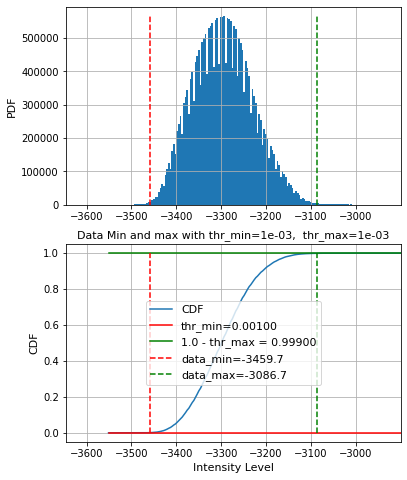

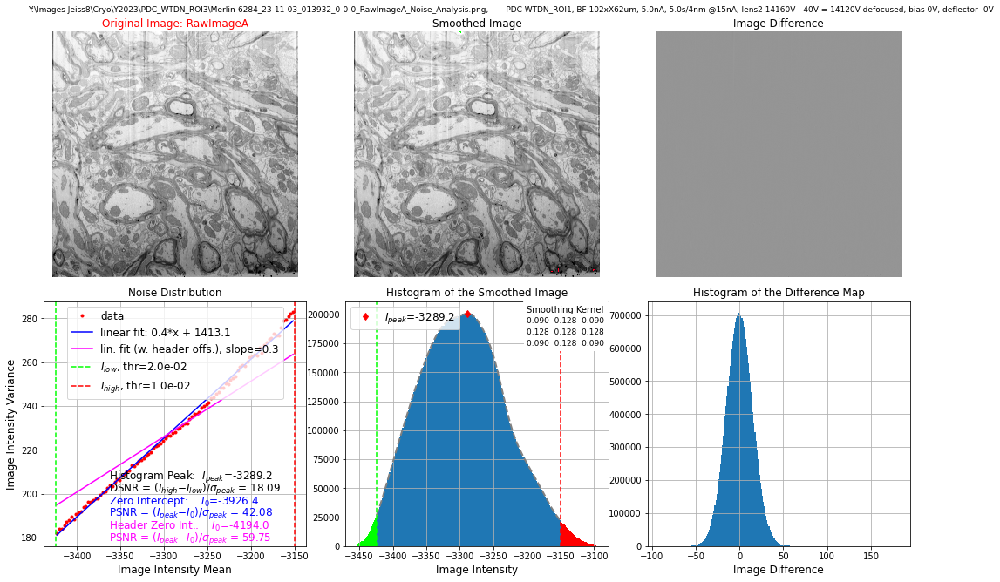

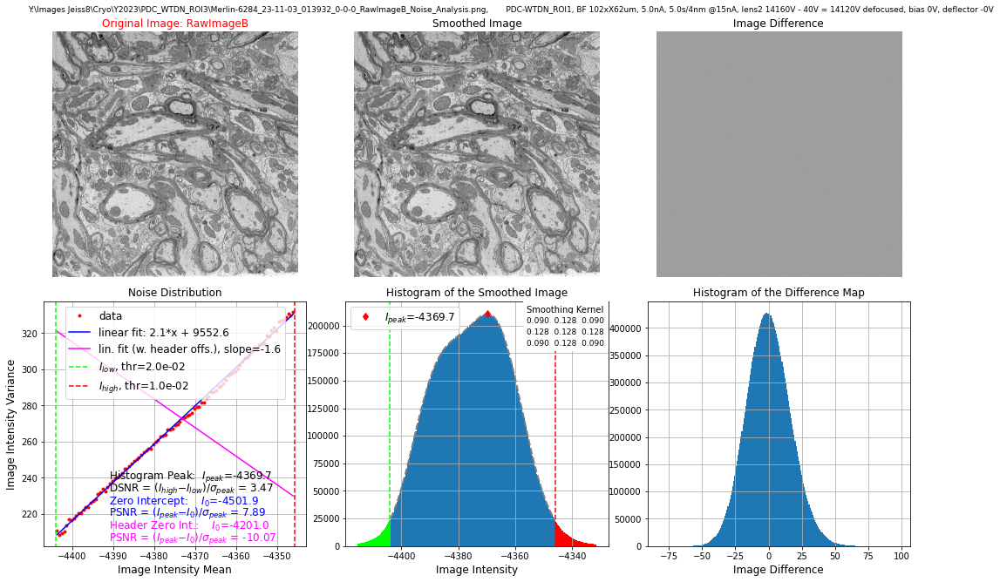

In [6]:
fr_inds = [2000]
for fr_ind in fr_inds:
    test_frame = FIBSEM_frame(fls[fr_ind])
    test_frame_suff = Path(test_frame.fname).suffix
    snapshot_name = os.path.join(data_dir, os.path.split(fls[fr_ind])[1].replace(test_frame_suff, '_snapshot.png'))
    test_frame.save_snapshot(snapshot_name=snapshot_name)
    get_min_max_thresholds(test_frame.RawImageA, disp_res=True)
    test_frame.save_images_tif()

    print('header scaling data:', test_frame.Scaling)
    image_name = 'RawImageA'
    res_fname = os.path.join(data_dir, os.path.split(fls[fr_ind])[1].replace(test_frame_suff, '_' + image_name + '_Noise_Analysis.png'))
    RawImageA_results = test_frame.analyze_noise_statistics(image_name=image_name, res_fname = res_fname)
    image_name = 'RawImageB'
    res_fname = os.path.join(data_dir, os.path.split(fls[fr_ind])[1].replace(test_frame_suff, '_' + image_name + '_Noise_Analysis.png'))
    RawImageA_results = test_frame.analyze_noise_statistics(image_name=image_name, res_fname = res_fname)

# Check the settings: Perform SIFT alignements on two frames in the middle of the stack

PDC-WTDN_ROI1
2024/05/14  19:50:01   Transformation Matrix determined using RegularizedAffineTransform using RANSAC solver
[[ 1.00002702e+00 -1.14843381e-04  2.66349010e-01]
 [ 3.64982215e-05  9.99726239e-01  7.94167423e-01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
11871 keypoint matches were detected with 1.5 pixel outlier threshold
Number of iterations: 4033
Wall time: 1min 12s


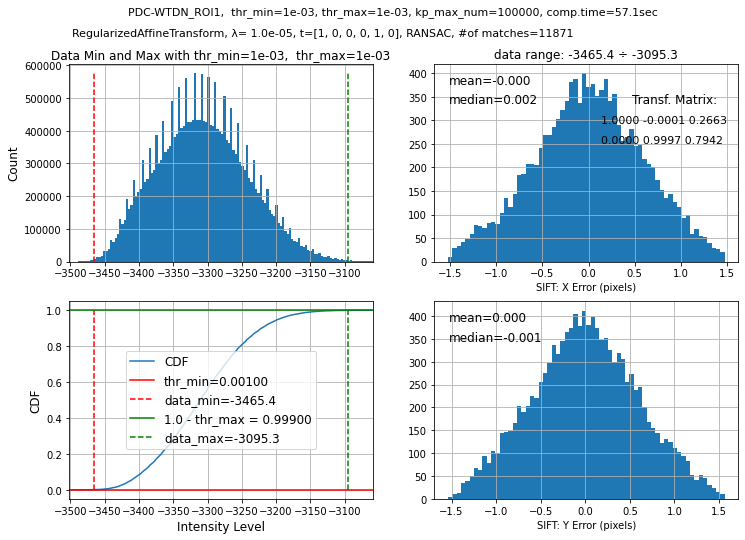

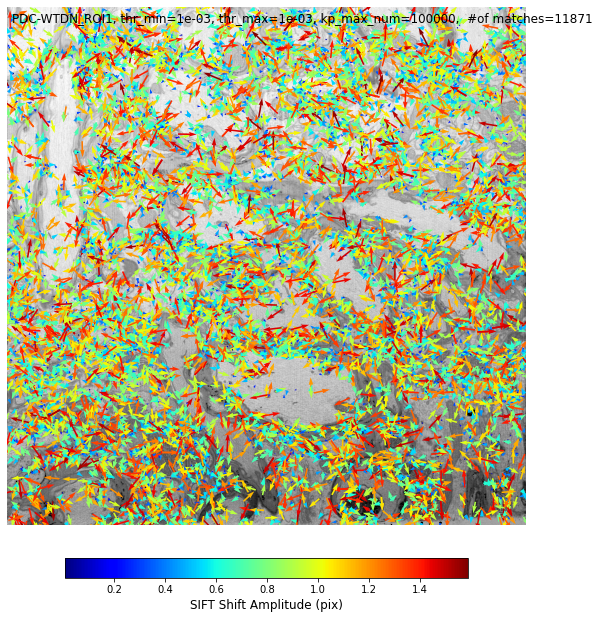

In [7]:
%%time
SIFT_evaluation_results = test_dataset.SIFT_evaluation()

# Step 1a. Evaluate Field Flatness and determine Correction Parameters

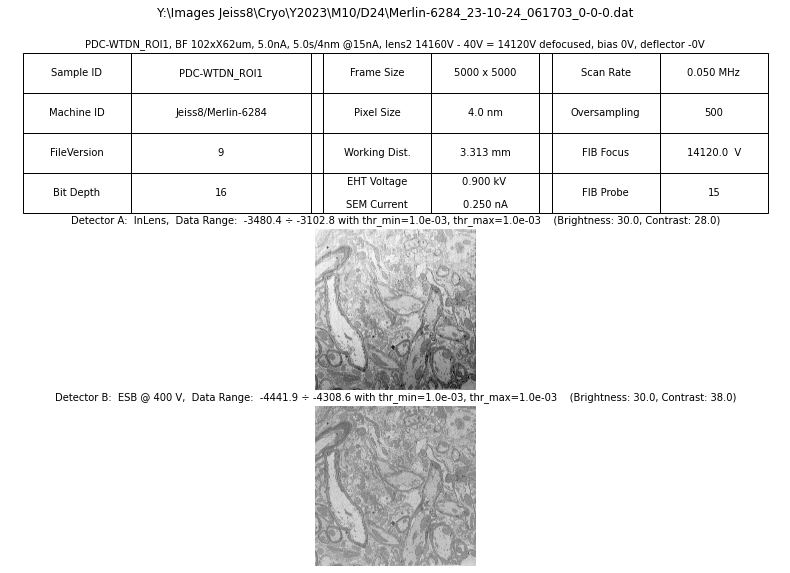

In [8]:
test_frame_ind = 500
test_frame = FIBSEM_frame(fls[test_frame_ind])
test_frame.save_snapshot()

Estimator coefficients 1, x, y, x^2, x y, y^2 :  [ 0.         -0.56681579  2.75236759  0.10653427  0.09369566  0.26329939]
Estimator intercept:  804.2652391248942
Estimator coefficients 1, x, y, x^2, x y, y^2 :  [ 0.          0.59173536  0.7537806  -0.02304587 -0.02998142 -0.02876496]
Estimator intercept:  -183.486762230526
Image Flattening Info saved into the binary file:  Y:\Images Jeiss8\Cryo\Y2023\PDC_WTDN_ROI3\Merlin-6284_23-10-24_061703_0-0-0_flatfield_corr.bin


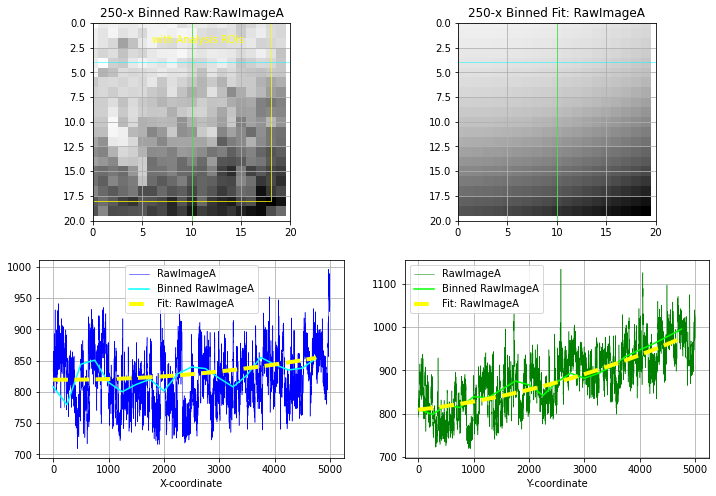

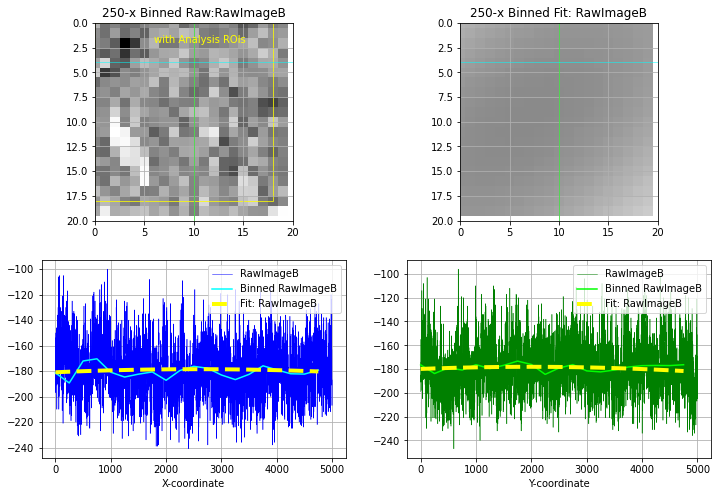

In [9]:
Analysis_ROIs=[[0, 5000, 0, 5000]]

corr_fname_png = os.path.splitext(os.path.split(fls[test_frame_ind])[1])[0] + '_flatfield_corr.png'
res_fname = os.path.join(data_dir, corr_fname_png)
flattening_params = test_frame.determine_field_fattening_parameters(image_names = ['RawImageA', 'RawImageB'],
                                                                     estimator = RANSACRegressor(),
                                                                     bins=250, Analysis_ROIs=Analysis_ROIs,
                                                                    Ysect=1000,
                                                                     calc_corr=True, save_correction_binary=True,
                                                                   res_fname = res_fname)

# Step 1b. Test Image Correction (Flattening)


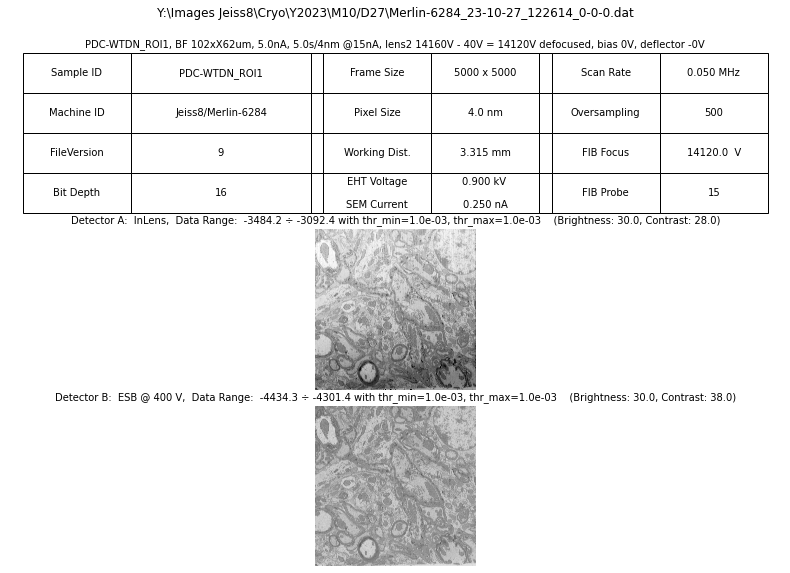

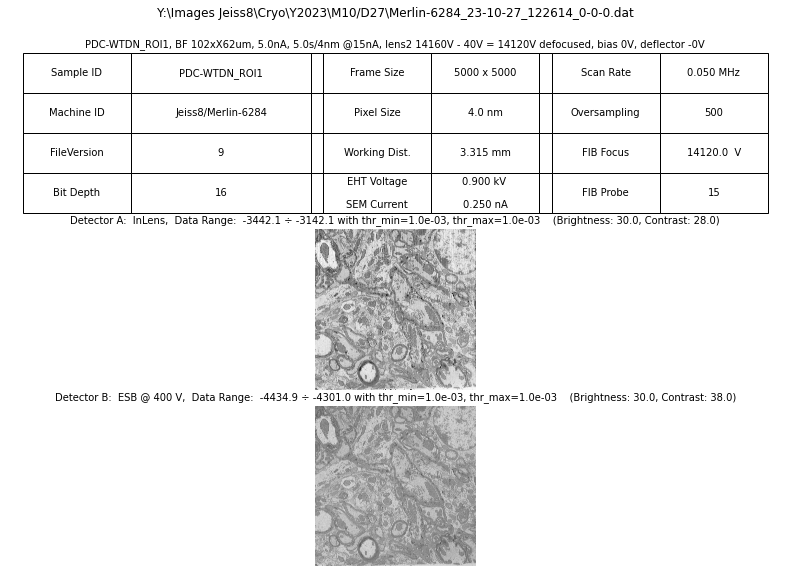

In [10]:
# test image correction
fr_ind = 1000
eval_frame = FIBSEM_frame(fls[fr_ind])
orig_snapshot_name = os.path.join(data_dir, os.path.split(fls[fr_ind])[1].replace('.dat', '_original_snapshot.png'))
eval_frame.save_snapshot(snapshot_name = orig_snapshot_name)
flattened_snapshot_name = os.path.join(data_dir, os.path.split(fls[fr_ind])[1].replace('.dat', '_flattened_snapshot.png'))
eval_frame.RawImageA, eval_frame.RawImageB = eval_frame.flatten_image(image_correction_file = test_frame.image_correction_file)
eval_frame.save_snapshot(snapshot_name = flattened_snapshot_name)

In [11]:
# if all is good - assign the image correction file to the test_dataset object
test_dataset.image_correction_file = test_frame.image_correction_file

# This is where the data processing begins. Perform SIFT Computations using DASK Distributed (local cluster, using SCATTER, MAP and GATHER)

# Step 2: Save InLens.tif Data (Optional)

In [12]:
if save_data_as_tiff:
    test_dataset.convert_raw_data_to_tif_files(DASK_client=client)

# Step 2b: Step 2b: Evaluate parameters of FIBSEM data set (Data Min/Max, Working Distance, Milling Y Voltage, FOV center positions)

2024/05/14  19:50:48   DASK client exists. Will perform distributed computations
Use http://localhost:55924/status to monitor DASK progress
Evaluating the parameters of FIBSEM data set (data Min/Max, Working Distance, Milling Y Voltage, FOV center positions, Scan Rate, EHT)
2024/05/14  19:50:49   Using DASK distributed
Using fit_params:  SG 11 3
2024/05/14  20:09:54   Saving the FIBSEM dataset statistics (Min/Max, Mill Rate, FOV Shifts into the file:  Y:\Images Jeiss8\Cryo\Y2023\PDC_WTDN_ROI3\FIBSEM_Data.xlsx
Z pixel = 3.68 nm  - based on WD data
Z pixel = 3.65 nm  - based on Milling Voltage data
Using fit_params:  SG 11 3
Wall time: 19min 22s


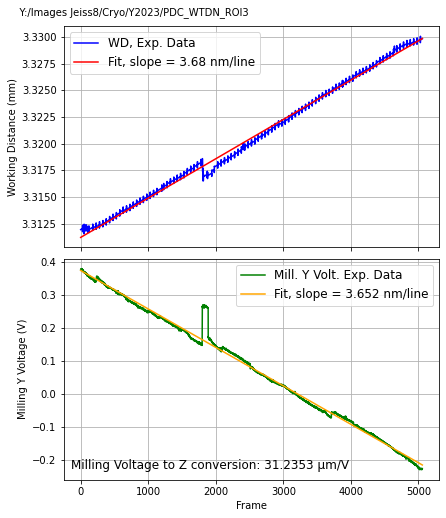

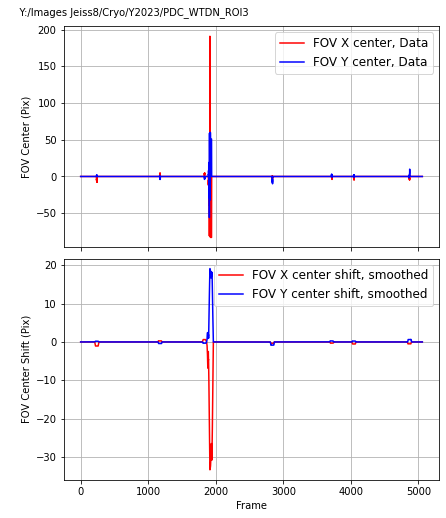

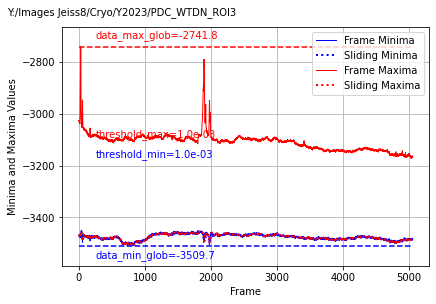

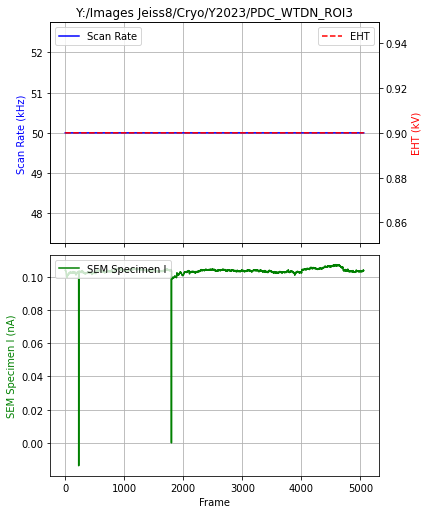

In [13]:
%%time
FIBSEM_Data = test_dataset.evaluate_FIBSEM_statistics(DASK_client=client, fit_params = ['SG', 11, 3])
generate_report_mill_rate_xlsx(FIBSEM_Data[0])
generate_report_FOV_center_shift_xlsx(FIBSEM_Data[0])
generate_report_data_minmax_xlsx(FIBSEM_Data[0])
generate_report_ScanRate_EHT_xlsx(FIBSEM_Data[0])

# Steps 3 and 4: Extract Key Points and Descriptors, Find Matches and Transformations

Step 3: Extract Key Points and Descriptors
2024/05/14  20:10:11   DASK client exists. Will perform distributed computations
Use http://localhost:55924/status to monitor DASK progress
2024/05/14  20:10:11   Using DASK distributed
Step 3: Elapsed time: 12103.10 seconds

Step 4: Select Good Matches with FLANN matcher
Step 4: using RegularizedAffineTransform Transformation Model with RANSAC solver
Step 4: RegularizedAffineTransform parameters:
Step 4: Regularization matrix: 
[[1.e-05 0.e+00 0.e+00 0.e+00 0.e+00 0.e+00]
 [0.e+00 1.e-05 0.e+00 0.e+00 0.e+00 0.e+00]
 [0.e+00 0.e+00 0.e+00 0.e+00 0.e+00 0.e+00]
 [0.e+00 0.e+00 0.e+00 1.e-05 0.e+00 0.e+00]
 [0.e+00 0.e+00 0.e+00 0.e+00 1.e-05 0.e+00]
 [0.e+00 0.e+00 0.e+00 0.e+00 0.e+00 0.e+00]]
Step 4: Target Solution:  [1 0 0 0 1 0]
2024/05/14  23:31:54   DASK client exists. Will perform distributed computations
Use http://localhost:55924/status to monitor DASK progress
2024/05/14  23:31:54   Using DASK distributed
Mean Number of Keypoints : 

Calculating Cummilative Transformation Matrix:   0%|          | 0/5057 [00:00<?, ?it/s]

Recalculating the shifts for preserved scales:   0%|          | 0/5057 [00:00<?, ?it/s]

Wall time: 11h 11min 49s


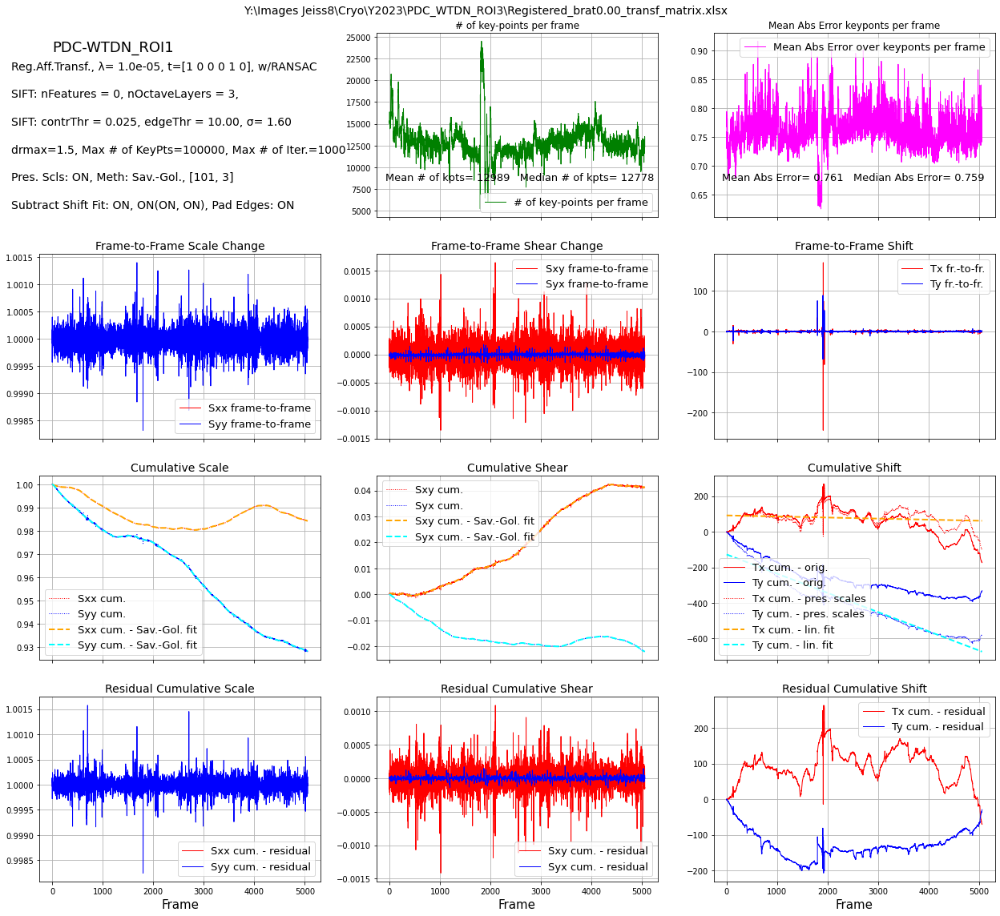

In [14]:
%%time
# Step 3: Extract Key Points and Descriptors using DASK Distributed
t1 = time.time()
print('Step 3: Extract Key Points and Descriptors')
fnms = test_dataset.extract_keypoints(DASK_client=client)   
t2 = time.time()
print('Step 3: Elapsed time: {:.2f} seconds'.format(t2 - t1))
print('')

# Step 4: Select good matches and extract transformation parameters using DASK Distributed
matcher_str = 'BF' if BFMatcher else 'FLANN'
print('Step 4: Select Good Matches with ' + matcher_str + ' matcher')
print('Step 4: using ' + test_dataset.TransformType.__name__ + ' Transformation Model with ' + solver + ' solver')
if test_dataset.TransformType == RegularizedAffineTransform:
    print('Step 4: ' + test_dataset.TransformType.__name__ + ' parameters:')
    print('Step 4: Regularization matrix: ')
    print(test_dataset.l2_matrix)
    print('Step 4: Target Solution: ', test_dataset.targ_vector)

results_s4 = test_dataset.determine_transformations(DASK_client=client)
t3 = time.time()
print('Step 4: Elapsed time: {:.2f} seconds'.format(t3 - t2))

tr_matr_cum_residual, tr_matr_cum_xlsx_file = test_dataset.process_transformation_matrix()
generate_report_transf_matrix_from_xlsx(tr_matr_cum_xlsx_file)

In [15]:
# here is an example of how the previous step can be modified easily without having to re-do all previous steps
# this will calculate the cumulative transformation matrix WITHOT modifying the object property subtract_linear_fit
# so this change will NOT propagate.
# tr_matr_cum_residual = test_dataset.process_transformation_matrix(subtract_linear_fit = [False, True])

# if you want to make permanet change, then you should do this:
# test_dataset.subtract_linear_fit = [False, True]
# tr_matr_cum_residual = test_dataset.process_transformation_matrix()


# Step 5: Search for frames with no (or low # of) matches and possibly remove them.

In [16]:
thr_npt = 3   # consider frame with less than 3 Key Points for removal
tr_matr_cum_residual = test_dataset.check_for_nomatch_frames(thr_npt, **SIFT_kwargs)

Frames with no matches to the next frame:   []
Frames to remove:   []
No frames selected for removal


# Step 6: Recall or Save the Intermediate Data (KeyPoints, Matches, Transf.Matrix, etc.) from / into spreadsheets and a binary files.  Remove the intermediate KeyPoint/Descriptor files.

In [17]:
recall_the_data = False          # if False, the data will be saved. if True, the data will be recalled

dump_filename = os.path.join(data_dir, test_dataset.fnm_reg.replace('.mrc', '_params.bin'))

if recall_the_data:
    test_dataset = FIBSEM_dataset(fls, recall_parameters=True, dump_filename=dump_filename, disp_res=True, **SIFT_kwargs)
else:
    saved_dump_file = test_dataset.save_parameters(dump_file=dump_filename)
    print('Parameters saved into the file: ', saved_dump_file)

Parameters saved into the file:  Y:\Images Jeiss8\Cryo\Y2023\PDC_WTDN_ROI3\Registered_brat0.00_params.bin


In [18]:
remove_key_points_data = True   # if True, the binary files with intermediate keypoints data for each frame will be removed

# Remove temporary files
if remove_key_points_data:
    # Remove the keypoint/ descriptor files
    for fnm in tqdm(test_dataset.fnms, desc='Removing KeyPoint/Descriptor Files: '):
        try:
            os.remove(os.path.join(data_dir, fnm))
        except:
            pass
    for fnm in tqdm(test_dataset.fnms_matches, desc='Removing Matched KeyPoint Files: '):
        try:
            os.remove(os.path.join(data_dir, fnm))
        except:
            pass

Removing KeyPoint/Descriptor Files:   0%|          | 0/5058 [00:00<?, ?it/s]

Removing Matched KeyPoint Files:   0%|          | 0/5057 [00:00<?, ?it/s]

# Define Evaluation Box

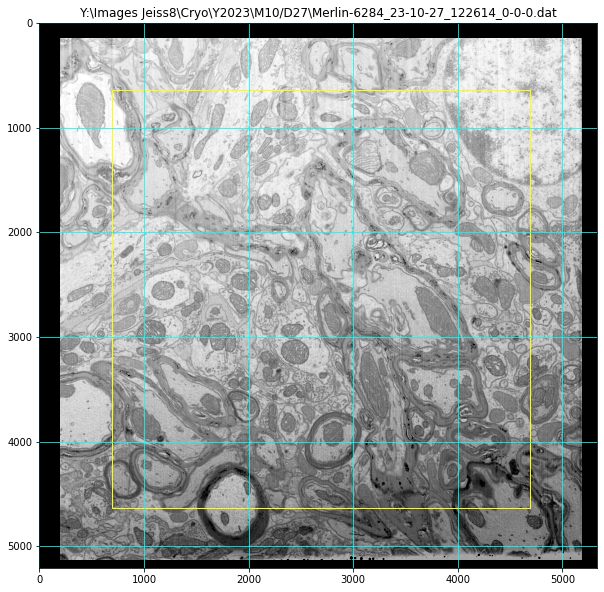

In [19]:
#evaluation_box = [250, 2000, 1450, 2650]      # optional evaluation box for defining the area over which the registration quality
#test_dataset.show_eval_box(evaluation_box = evaluation_box, invert_data=False)
#
# default frames are three frames: 10% from the start, 50% from the start, and 90% from the start
# alternatively you can set any list of frame indecis by using keyword frame_indices
# for example:0
# test_dataset.show_eval_box(frame_indices=[1, 100, 850], evaluation_box = evaluation_box, invert_data=False)
#
fr_ind = 1000
evaluation_box = [500, 4000, 500, 4000]
test_dataset.show_eval_box(invert_data=False, frame_inds=[fr_ind], evaluation_box=evaluation_box)

# Evaluate Image B fraction for fused image using Auto-Correlation and Cross-Correlation

Analyzing Auto-Correlation SNRs :   0%|          | 0/1 [00:00<?, ?it/s]

2024/05/15  07:29:31   Saved the results into the file:  Y:\Images Jeiss8\Cryo\Y2023\PDC_WTDN_ROI3\Merlin-6284_23-10-27_122614_0-0-0_ImgA_SNR.png
2024/05/15  07:29:44   Saved the results into the file:  Y:\Images Jeiss8\Cryo\Y2023\PDC_WTDN_ROI3\Merlin-6284_23-10-27_122614_0-0-0_ImgB_SNR.png


Re-analyzing Auto-Correlation SNRs for fused image:   0%|          | 0/1 [00:00<?, ?it/s]

2024/05/15  07:29:58   Saved the results into the file:  Y:\Images Jeiss8\Cryo\Y2023\PDC_WTDN_ROI3\Merlin-6284_23-10-27_122614_0-0-0_ImgB_fr0.034_SNR.png
Wall time: 41.7 s


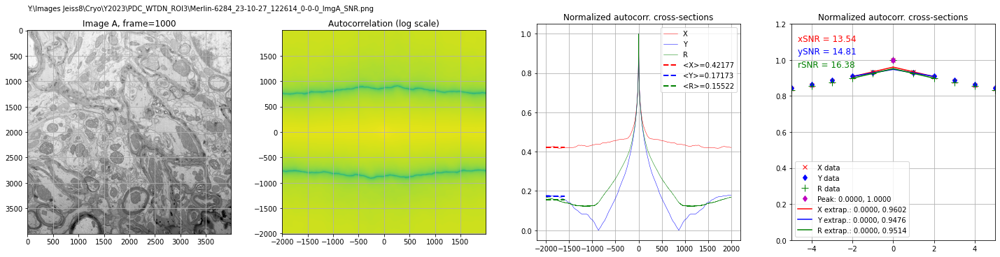

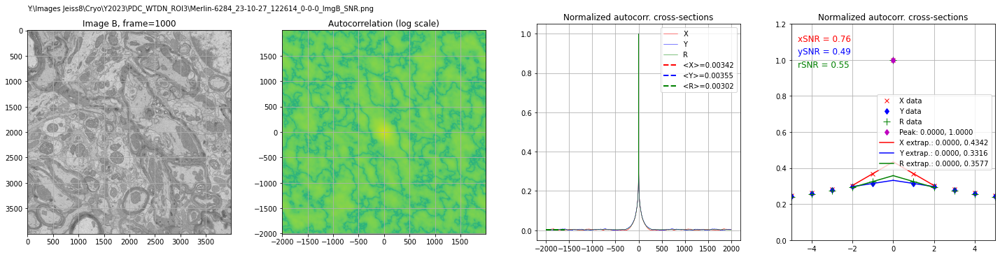

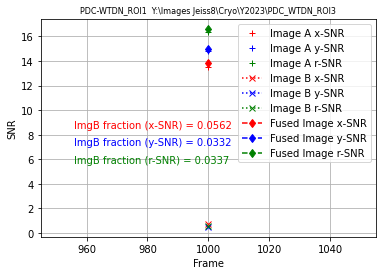

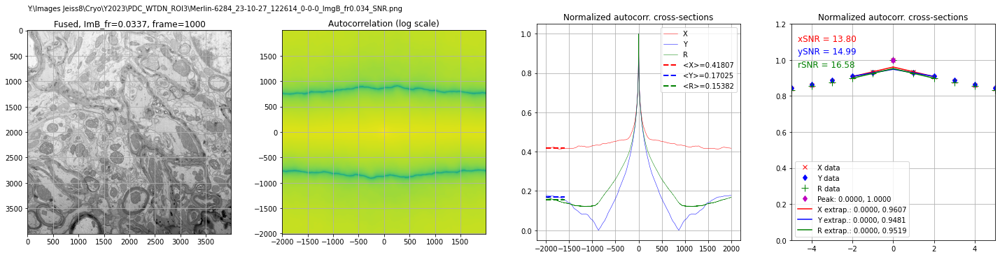

In [20]:
%%time
fr_ind = 1000
evaluation_box = [500, 4000, 500, 4000]
test_dataset.estimate_SNRs(frame_inds=[fr_ind],
                           #ImgB_fraction = 0.08,
                           perform_transformation = False,
                           evaluation_box = evaluation_box, save_res_png=True)

2024/05/15  07:30:16   DASK client exists. Will perform distributed computations
Use http://localhost:55924/status to monitor DASK progress


Evaluating Img B fractions:   0%|          | 0/11 [00:00<?, ?it/s]

2024/05/15  07:30:17   DASK client exists. Will perform distributed computations
Use http://localhost:55924/status to monitor DASK progress
2024/05/15  07:30:33   DASK client exists. Will perform distributed computations
Use http://localhost:55924/status to monitor DASK progress
2024/05/15  07:30:50   DASK client exists. Will perform distributed computations
Use http://localhost:55924/status to monitor DASK progress
2024/05/15  07:31:06   DASK client exists. Will perform distributed computations
Use http://localhost:55924/status to monitor DASK progress
2024/05/15  07:31:23   DASK client exists. Will perform distributed computations
Use http://localhost:55924/status to monitor DASK progress
2024/05/15  07:31:39   DASK client exists. Will perform distributed computations
Use http://localhost:55924/status to monitor DASK progress
2024/05/15  07:31:56   DASK client exists. Will perform distributed computations
Use http://localhost:55924/status to monitor DASK progress
2024/05/15  07:32:12

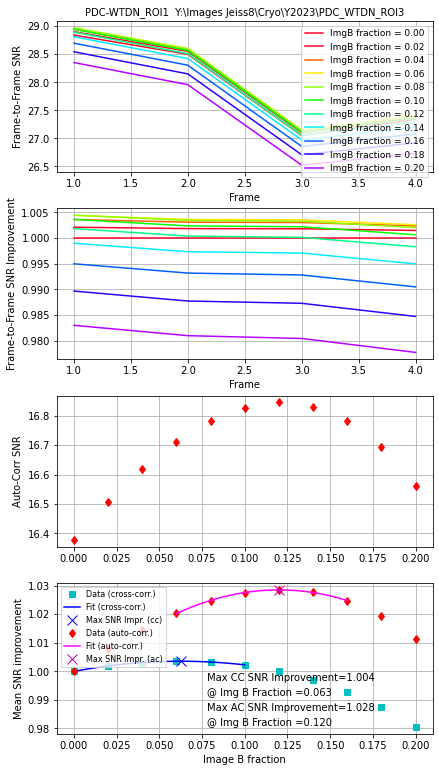

In [21]:
%%time
evaluation_box = [500, 4000, 500, 4000]
frame_inds = 1000 + np.arange(5)
ImgB_fractions = np.linspace(0.00, 0.20, 11)
ImgB_fr_optimal_mid = test_dataset.evaluate_ImgB_fractions(ImgB_fractions, frame_inds,
                                                           DASK_client=client, use_DASK=True,
                                                           evaluation_box = evaluation_box)

# Step 7: Transform and Save the FIB-SEM data

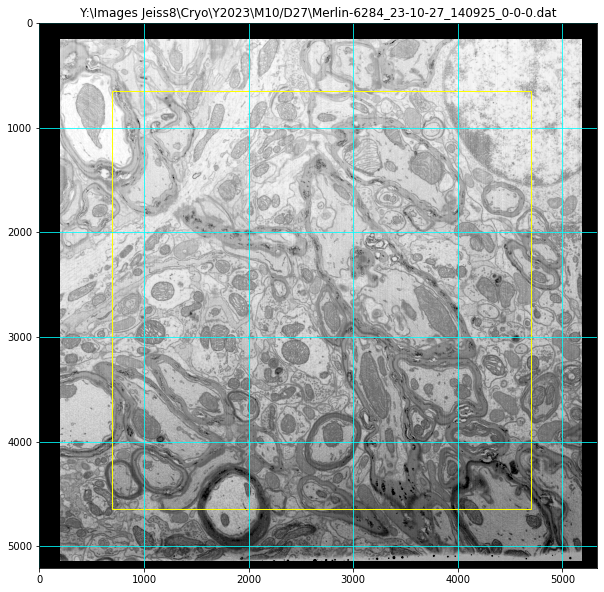

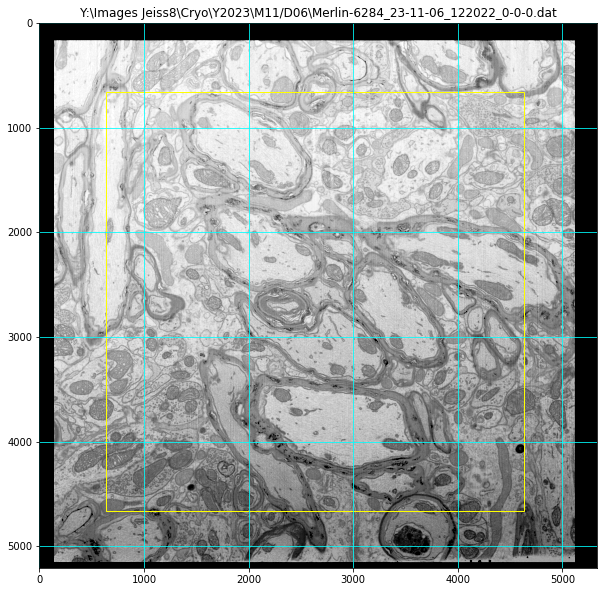

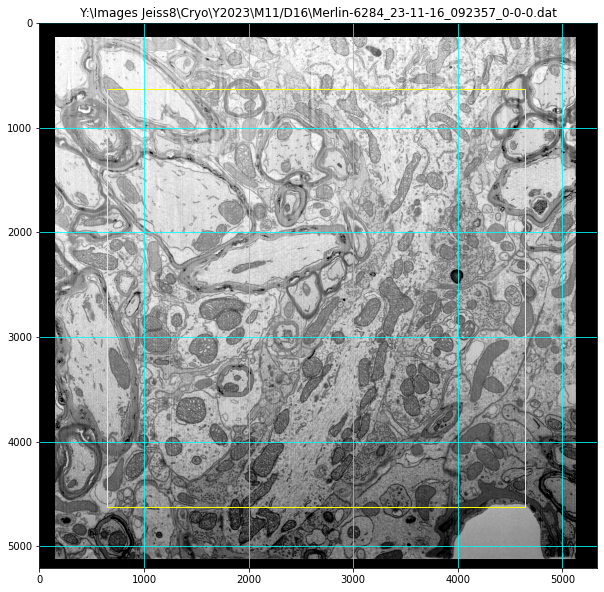

In [22]:
evaluation_box = [500, 4000, 500, 4000]
test_dataset.show_eval_box(invert_data=False,
                           frame_inds = [nfrs//5, nfrs//2, nfrs//5*4],
                           evaluation_box=evaluation_box)

Step 7: Transform and Save the FIB-SEM data
2024/05/15  07:34:02   DASK client exists. Will perform distributed computations
Use http://localhost:55924/status to monitor DASK progress
Transforming and Saving Intermediate Registered Frames
2024/05/15  07:34:17   Transform and Save Chunks of Frames: Starting DASK jobs
2024/05/15  08:11:09   Finished DASK jobs
Analyzing Registration Quality
2024/05/15  08:11:12   Analyzing Frame Registration: Starting DASK jobs
2024/05/15  08:38:46   Finished DASK jobs
2024/05/15  08:39:00   Saving the Registration Quality Statistics into the file:  Y:\Images Jeiss8\Cryo\Y2023\PDC_WTDN_ROI3\PDC_WTDN_ROI3_RegAffine_l2_1e-05_brat0.00_RegistrationQuality.xlsx
Registered data set is NOT saved into a file


Removing Intermediate Registered Frame Files:   0%|          | 0/5058 [00:00<?, ?it/s]

Wall time: 1h 9min 57s


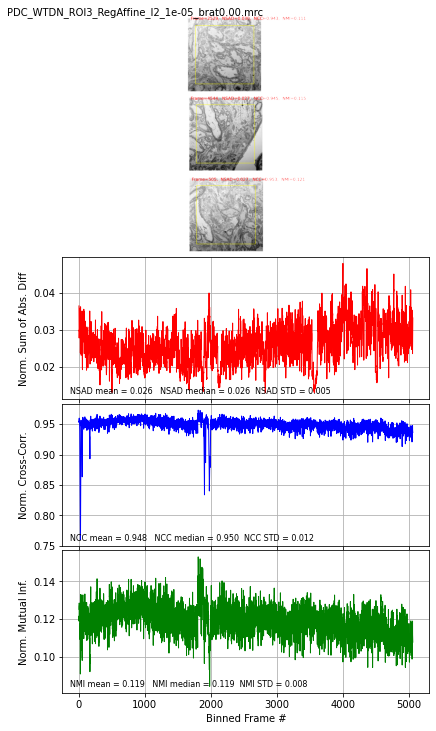

In [23]:
%%time

print('Step 7: Transform and Save the FIB-SEM data')

test_dataset.fnm_reg = 'PDC_WTDN_ROI3_RegAffine_l2_1e-05_brat0.00.mrc'

evaluation_box = [500, 4000, 500, 4000]

reg_summary_RegAffine_ImB0p00, reg_summary_RegAffine_ImB0p00_xlsx = test_dataset.transform_and_save(DASK_client=client,
                                                        save_transformed_dataset = False,
                                                        save_registration_summary = True,
                                                        flatten_image = False,
                                                        ImgB_fraction=0.00,
                                                        add_offset = True,
                                                        zbin_factor = 1,
                                                        evaluation_box = evaluation_box,
                                                        sliding_evaluation_box = False,
                                                        fnm_types = ['mrc'])

generate_report_from_xls_registration_summary(reg_summary_RegAffine_ImB0p00_xlsx)

In [ ]:
%%time

print('Step 7: Transform and Save the FIB-SEM data')

test_dataset.fnm_reg = 'PDC_WTDN_ROI3_RegAffine_l2_1e-05_brat0.00_flattened.mrc'

evaluation_box = [500, 4000, 500, 4000]

reg_summary_RegAffine_ImB0p00_flattened, reg_summary_RegAffine_ImB0p00_flattened_xlsx = test_dataset.transform_and_save(DASK_client=client,
                                                        save_transformed_dataset = False,
                                                        save_registration_summary = True,
                                                        flatten_image = True,
                                                        ImgB_fraction=0.00,
                                                        add_offset = True,
                                                        zbin_factor = 1,
                                                        evaluation_box = evaluation_box,
                                                        sliding_evaluation_box = False,
                                                        fnm_types = ['mrc'])

generate_report_from_xls_registration_summary(reg_summary_RegAffine_ImB0p00_flattened_xlsx)

Step 7: Transform and Save the FIB-SEM data
2024/05/15  08:44:01   DASK client exists. Will perform distributed computations
Use http://localhost:55924/status to monitor DASK progress
Transforming and Saving Intermediate Registered Frames
2024/05/15  08:44:16   Transform and Save Chunks of Frames: Starting DASK jobs


In [ ]:
%%time

print('Step 7: Transform and Save the FIB-SEM data')

test_dataset.fnm_reg = 'PDC_WTDN_ROI3_RegAffine_l2_1e-05_brat0.08_flattened.mrc'

evaluation_box = [500, 4000, 500, 4000]

reg_summary_RegAffine_ImB0p08_flattened, reg_summary_RegAffine_ImB0p08_flattened_xlsx = test_dataset.transform_and_save(DASK_client=client,
                                                        save_transformed_dataset = True,
                                                        save_registration_summary = True,
                                                        flatten_image = True,
                                                        ImgB_fraction=0.08,
                                                        add_offset = True,
                                                        zbin_factor = 1,
                                                        evaluation_box = evaluation_box,
                                                        sliding_evaluation_box = False,
                                                        fnm_types = ['mrc'])

generate_report_from_xls_registration_summary(reg_summary_RegAffine_ImB0p08_flattened_xlsx)

In [ ]:
orig_mrc = os.path.normpath('Y:\Images Jeiss8\Cryo\Y2023\PDC_WTDN_ROI3\PDC_WTDN_ROI3_RegAffine_l2_1e-05_brat0.08_flattened.mrc')
binned_mrc = orig_mrc.replace('.mrc', '_16nm.mrc')
bin_crop_mrc_stack(orig_mrc,
                   binned_copped_filename  = binned_mrc,
                   DASK_client=client,
                  xbin_factor=4,
                  ybin_factor=4,
                  zbin_factor=4)

In [ ]:
binned_mrc = 'Y:/Images Jeiss8/Cryo/Y2023/PDC_WTDN_ROI3/PDC_WTDN_ROI3_RegAffine_l2_1e-05_brat0.08_flattened_16nm.mrc'

mrc_obj = mrcfile.mmap(binned_mrc, mode='r', permissive=True)
header = mrc_obj.header
'''
    mode 0 -> uint8
    mode 1 -> int16
    mode 2 -> float32
    mode 4 -> complex64
    mode 6 -> uint16
'''
mrc_mode = mrc_obj.header.mode
test_frame_ind = 500
test_frame = mrc_obj.data[test_frame_ind, :, :]
mrc_obj.close()

vmin, vmax = get_min_max_thresholds(test_frame[200: -200, 200: -200], disp_res=False)
fig, ax = plt.subplots(1,1, figsize=(10, 10))
ax.imshow(test_frame, cmap='Greys', vmin=vmin, vmax=vmax)
ax.grid(True)
#ax.axis(False)
#ax.axis(False)
add_scale_bar(ax, pixel=0.004, bar_length=5.0, bar_width=5, bar_label='')

get_min_max_thresholds(test_frame)

In [ ]:
binned_mrc = 'Y:/Images Jeiss8/Cryo/Y2023/PDC_WTDN_ROI3/PDC_WTDN_ROI3_RegAffine_l2_1e-05_brat0.08_flattened_16nm.mrc'
images, axs = plot_cross_sections_mrc_stack(binned_mrc,
                                            bar_width = 3,
                                            bar_length_um = 5,
                                            label_offset = 30,
                                            label_font_size = 8.0,
                                            EM_max = 950, 
                                            dpi=300)

In [ ]:
DarkA = -4027.9
DarkB = -4520.8
ImgB_fraction=0.12
image_offs = DarkA*(1.0-ImgB_fraction) + DarkB*ImgB_fraction


dmin_new = test_dataset.FIBSEM_Data[3]- DarkA
image_scales = np.mean(dmin_new)/dmin_new
fig, ax = plt.subplots(1,1, figsize = (6, 4))
ax.plot(image_scales, 'b')
ax.set_xlabel('Frame')
ax.set_ylabel('Image Scale')
ax.grid(True)

image_offsets = image_scales*0.0 + image_offs

In [ ]:
%%time

print('Step 7: Transform and Save the FIB-SEM data')

test_dataset.fnm_reg = 'PDC_WTDN_ROI3_RegAffine_l2_1e-05_brat0.08_flattened_v2.mrc'

evaluation_box = [500, 4000, 500, 4000]

reg_summary_RegAffine_ImB0p08_flattened, reg_summary_RegAffine_ImB0p08_flattened_xlsx = test_dataset.transform_and_save(DASK_client=client,
                                                        save_transformed_dataset = True,
                                                        save_registration_summary = True,
                                                        flatten_image = True,
                                                        ImgB_fraction=0.08,
                                                        image_scales = image_scales,
                                                        image_offsets = image_offsets,
                                                        add_offset = True,
                                                        zbin_factor = 1,
                                                        evaluation_box = evaluation_box,
                                                        sliding_evaluation_box = False,
                                                        fnm_types = ['mrc'])

generate_report_from_xls_registration_summary(reg_summary_RegAffine_ImB0p08_flattened_xlsx)

In [ ]:
orig_mrc = os.path.normpath('Y:\Images Jeiss8\Cryo\Y2023\PDC_WTDN_ROI3\PDC_WTDN_ROI3_RegAffine_l2_1e-05_brat0.08_flattened_v2.mrc')
binned_mrc = orig_mrc.replace('.mrc', '_16nm.mrc')
bin_crop_mrc_stack(orig_mrc,
                   DASK_client = client,
                   binned_copped_filename  = binned_mrc,
                  xbin_factor=4,
                  ybin_factor=4,
                  zbin_factor=4)

In [ ]:
images, axs = plot_cross_sections_mrc_stack(binned_mrc,
                                            bar_width = 3,
                                            bar_length_um = 5,
                                            label_offset = 30,
                                            label_font_size = 8.0,
                                            EM_max = 950, 
                                            dpi=300)

In [ ]:
%%time

print('Step 7: Transform and Save the FIB-SEM data')

test_dataset.fnm_reg = 'PDC_WTDN_ROI3_raw.mrc'

evaluation_box = [500, 4000, 500, 4000]

reg_summary_raw, reg_summary_RegAffine_raw_xlsx = test_dataset.transform_and_save(DASK_client=client,
                                                        save_transformed_dataset = False,
                                                        save_registration_summary = True,
                                                        perform_transformation=False,
                                                        flatten_image = False,
                                                        ImgB_fraction=0.00,
                                                        add_offset = True,
                                                        zbin_factor = 1,
                                                        evaluation_box = evaluation_box,
                                                        sliding_evaluation_box = False,
                                                        fnm_types = ['mrc'])

generate_report_from_xls_registration_summary(reg_summary_RegAffine_raw_xlsx)

In [ ]:
reg_summary_RegAffine_raw_xlsx = 'Y:\Images Jeiss8\Cryo\Y2023\PDC_WTDN_ROI3\PDC_WTDN_ROI3_raw_RegistrationQuality.xlsx'
reg_summary_RegAffine_ImB0p00_xlsx = 'Y:\Images Jeiss8\Cryo\Y2023\PDC_WTDN_ROI3\PDC_WTDN_ROI3_RegAffine_l2_1e-05_brat0.00_RegistrationQuality.xlsx'
reg_summary_RegAffine_ImB0p00_flattened_xlsx = 'Y:\Images Jeiss8\Cryo\Y2023\PDC_WTDN_ROI3\PDC_WTDN_ROI3_RegAffine_l2_1e-05_brat0.00_flattened_RegistrationQuality.xlsx'
reg_summary_RegAffine_ImB0p08flattened_xlsx = 'Y:\Images Jeiss8\Cryo\Y2023\PDC_WTDN_ROI3\PDC_WTDN_ROI3_RegAffine_l2_1e-05_brat0.08_flattened_RegistrationQuality.xlsx'

In [ ]:
reg_qual_fls = [reg_summary_RegAffine_raw_xlsx,
                reg_summary_RegAffine_ImB0p00_xlsx,
                reg_summary_RegAffine_ImB0p00_flattened_xlsx,
                reg_summary_RegAffine_ImB0p08_flattened_xlsx]
pfs = ['Raw Data',
       'Reg.Aff., λ=1e-5, ImgA',
       'Reg.Aff., λ=1e-5, ImgA, flattened',
       'Reg.Aff., λ=1e-5, 0.92xImgA + 0.08xImgB, flattened']

colors = ['grey', 'red', 'magenta', 'blue']
linewidths = [0.5, 0.5, 0.4, 0.3, 0.2]

save_filename = os.path.join(data_dir, 'Regstration_Summary_PDC_WTDN_ROI3.png')
plot_registrtion_quality_xlsx(reg_qual_fls, pfs, save_filename=save_filename,
                              linewidths = linewidths,
                              colors = colors,
                              ncc_bounds = [0.8, 1.0])
                              #nsad_bounds=[0.00, 0.15],
                              #nmi_bounds=[0.05, 0.20])

# add a plot of FiJi on top to make it more visible.
overplot = False
if overplot:
    ax = plt.gca()
    for j, fl in enumerate(reg_qual_fls[0:2]):
        rdata = data = pd.read_excel(fl, sheet_name='Registration Quality Statistics')
        image_ncc = np.array(rdata['Image NCC'])
        ax.plot(image_ncc, color=colors[j], linewidth=linewidths[j])
    fig = plt.gcf()
    fig.savefig(os.path.join(data_dir, 'Regstration_Summary_PDC_WTDN_ROI3_fig_and_table.png'), dpi=300) 

generating the registration quality summary plots:   0%|          | 0/4 [00:00<?, ?it/s]

saving the data into xlsx file:   0%|          | 0/4 [00:00<?, ?it/s]

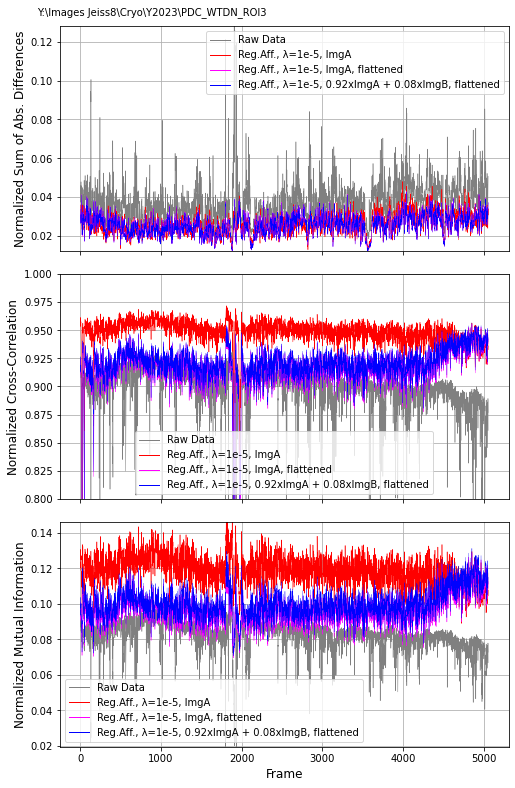

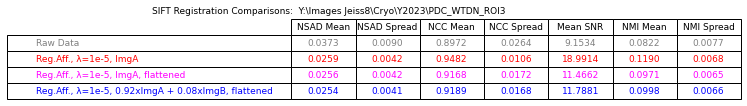

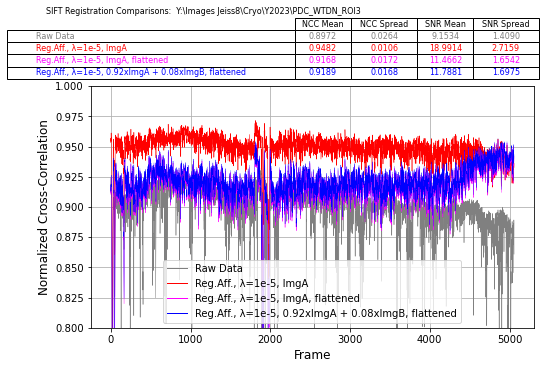

In [35]:
reg_qual_fls = [reg_summary_RegAffine_raw_xlsx,
                reg_summary_RegAffine_ImB0p00_xlsx,
                reg_summary_RegAffine_ImB0p00_flattened_xlsx,
                reg_summary_RegAffine_ImB0p08_flattened_xlsx]
pfs = ['Raw Data',
       'Reg.Aff., λ=1e-5, ImgA',
       'Reg.Aff., λ=1e-5, ImgA, flattened',
       'Reg.Aff., λ=1e-5, 0.92xImgA + 0.08xImgB, flattened']

colors = ['grey', 'red', 'magenta', 'blue']
linewidths = [0.5, 0.5, 0.4, 0.3, 0.2]

save_filename = os.path.join(data_dir, 'Regstration_Summary_PDC_WTDN_ROI3.png')
plot_registrtion_quality_xlsx(reg_qual_fls, pfs, save_filename=save_filename,
                              linewidths = linewidths,
                              colors = colors,
                              ncc_bounds = [0.8, 1.0])
                              #nsad_bounds=[0.00, 0.15],
                              #nmi_bounds=[0.05, 0.20])

# add a plot of FiJi on top to make it more visible.
overplot = False
if overplot:
    ax = plt.gca()
    for j, fl in enumerate(reg_qual_fls[0:2]):
        rdata = data = pd.read_excel(fl, sheet_name='Registration Quality Statistics')
        image_ncc = np.array(rdata['Image NCC'])
        ax.plot(image_ncc, color=colors[j], linewidth=linewidths[j])
    fig = plt.gcf()
    fig.savefig(os.path.join(data_dir, 'Regstration_Summary_PDC_WTDN_ROI3_fig_and_table.png'), dpi=300) 

# Estimate X-Y Resolution

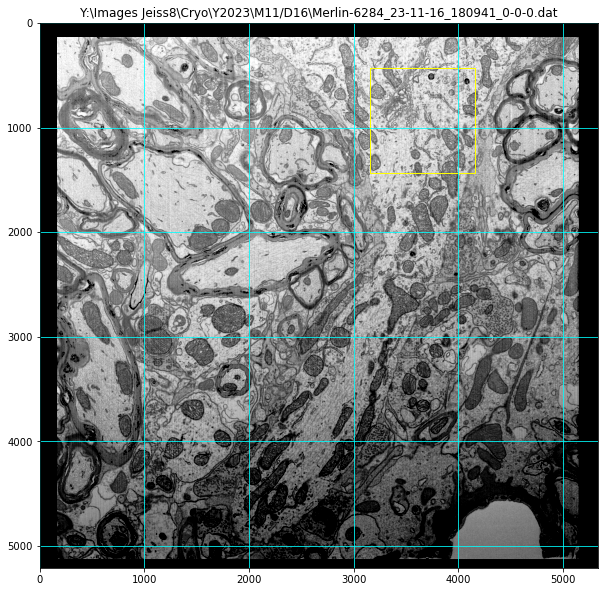

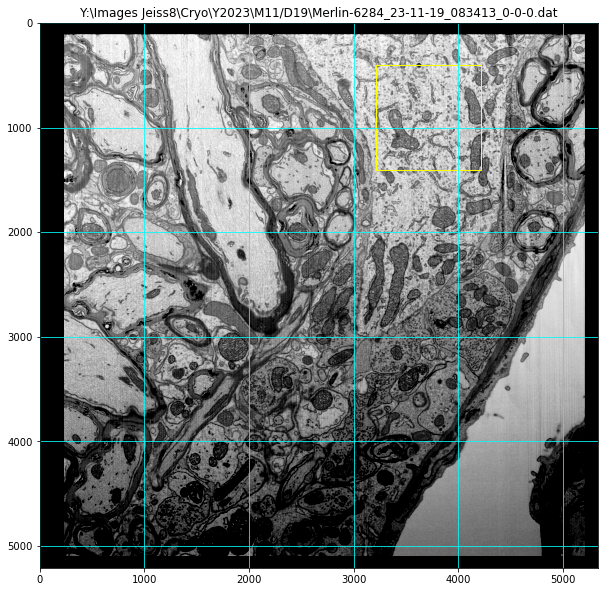

In [36]:
inds = np.arange(4100, 4500, 1)

evaluation_box = [300, 1000, 3000, 1000]

test_dataset.show_eval_box(invert_data=False,
                           frame_inds = [inds[0], inds[-1]],
                           evaluation_box=evaluation_box)

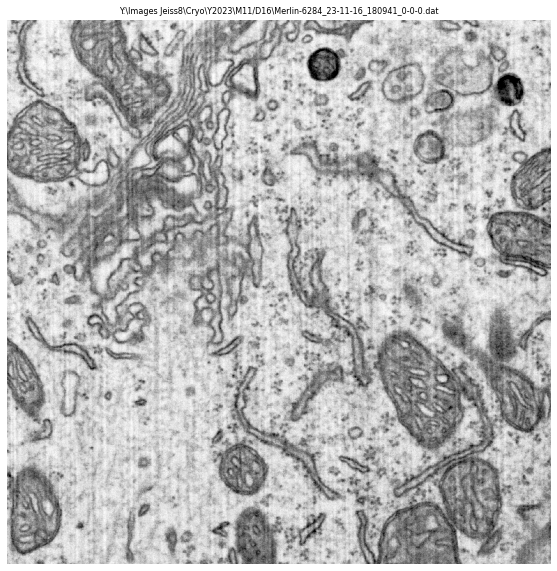

In [37]:
xi = evaluation_box[2]
xa = xi + evaluation_box[3]
yi = evaluation_box[0]
ya = yi + evaluation_box[1]
test_image = FIBSEM_frame(fls[inds[0]]).ImageA[yi:ya, xi:xa]
fig, ax = plt.subplots(1,1, figsize=(10,10))
vmin, vmax = get_min_max_thresholds(test_image, disp_res=False)
ax.imshow(test_image, cmap='Greys', vmin=vmin, vmax=vmax)
ax.axis(False)
ax.set_title(fls[inds[0]], fontsize = 8)
fig.savefig(fls[inds[0]].replace('.dat', '_subset.png'), dpi=300)
tiff.imsave(fls[inds[0]].replace('.dat', '_subset.tiff'), test_image)

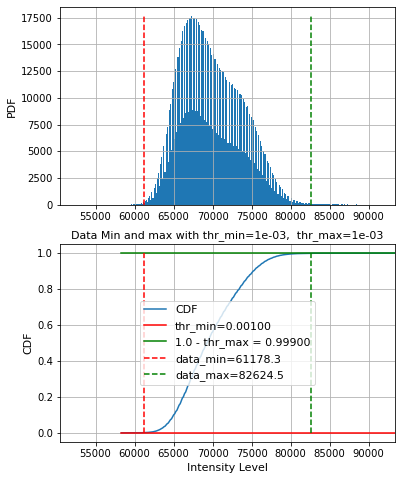

In [38]:
vmin, vmax = get_min_max_thresholds(test_image, disp_res=True)

DASK client exists. Will perform distributed computations
Use http://localhost:8787/status to monitor DASK progress
Using DASK distributed


C:\ProgramData\Anaconda3\lib\site-packages\distributed\worker.py:4149: UserWarning: Large object of size 1.41 MiB detected in task graph: 
  ([array(['Y:\\Images Jeiss8\\Cryo\\Y2023\\M10/D21\ ... False, False],)
Consider scattering large objects ahead of time
with client.scatter to reduce scheduler burden and 
keep data on workers

    future = client.submit(func, big_data)    # bad

    big_future = client.scatter(big_data)     # good
    future = client.submit(func, big_future)  # good
  warnings.warn(


Finished computations, generating reports


Generating images/plots for the sample 2D blobs:   0%|          | 0/6 [00:00<?, ?it/s]

Wall time: 2min 49s


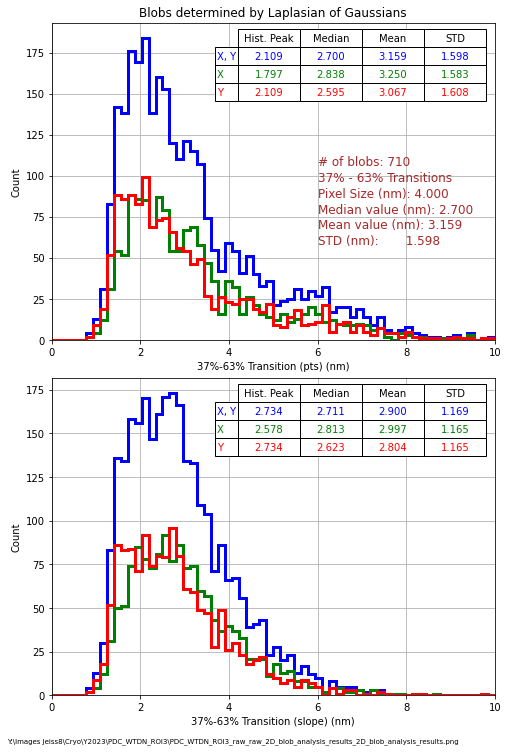

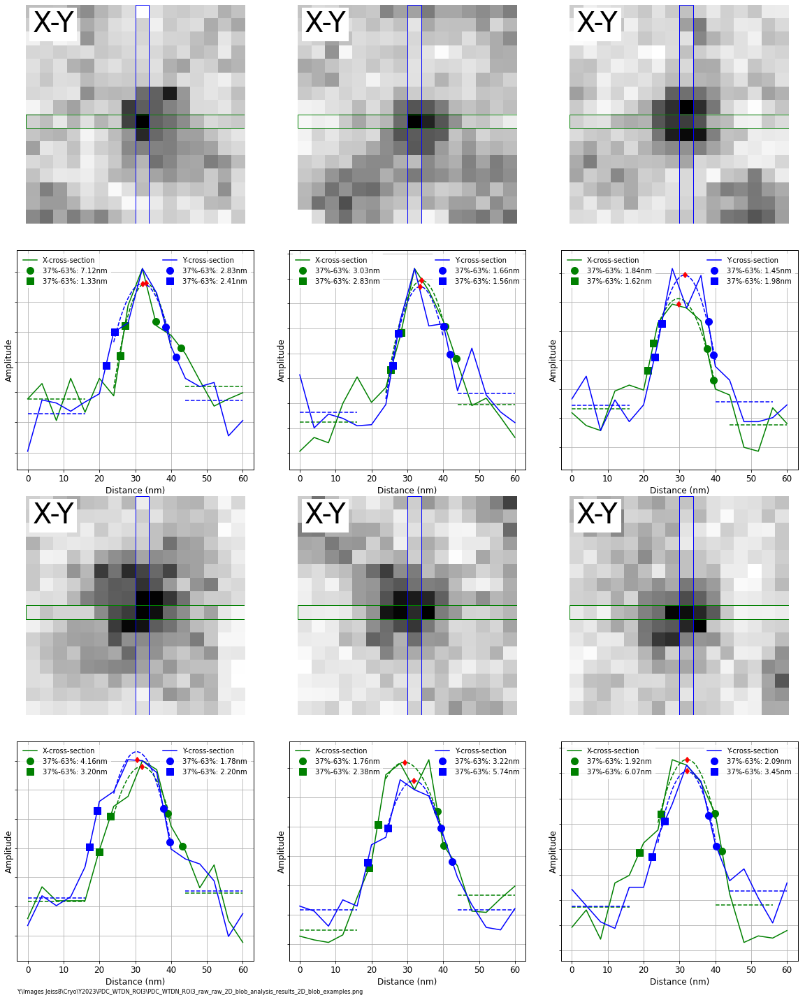

In [39]:
%%time

min_sigma = 1.0          # sigma (in pixel units) for Gaussian kernel in LoG search
max_sigma = 1.5          # sigma (in pixel units) for Gaussian kernel in LoG search
threshold = 4000        # threshold for LoG search. The absolute lower bound for scale space maxima. Local maxima smaller
                         # than threshold are ignored. Reduce this to detect blobs with less intensities
overlap = 0.1            # A value between 0 and 1. If the area of two blobs overlaps by a fraction greater than 'overlap', the smaller blob is eliminated.
pixel_size = 4.0         #  pixel size in nm
subset_size = 16         #  subset size (pixels) for blob / transition analysis
bounds = [0.37, 0.63]    #  List of of transition limits
bands = [5, 5, 5]        # list of three ints for the averaging bands for determining the left min, peak, and right min of the cross-section profile.
min_thr = 0.4            # threshold for identifying a 'good' transition (bottom < min_thr* top)

perform_transformation = False

if perform_transformation:
    results_file_xlsx =os.path.join(data_dir, os.path.splitext(test_dataset.fnm_reg)[0]+'_transformed_2D_blob_analysis_results.xlsx')
else:
    results_file_xlsx =os.path.join(data_dir, os.path.splitext(test_dataset.fnm_reg)[0]+'_raw_2D_blob_analysis_results.xlsx')

results = test_dataset.estimate_resolution_blobs_2D(DASK_client=client,
                                                    image_name='ImageA',
                                               frame_inds = inds,
                                               evaluation_box=evaluation_box,
                                              min_sigma = min_sigma,
                                              max_sigma = max_sigma,
                                              threshold = threshold,
                                              overlap = overlap,
                                              pixel_size = pixel_size,
                                              subset_size = subset_size,
                                              bounds = bounds,
                                              bands = bands,
                                              min_thr = min_thr,
                                              title = fls[inds[0]],
                                              verbose = False,
                                              disp_res = False,
                                              perform_transformation = perform_transformation,
                                              save_data_xlsx =True,
                                              results_file_xlsx = results_file_xlsx)

print('Finished computations, generating reports')

results_file_xlsx, frame_inds, error_flags, blobs_LoG, tr_results = results
save_fname1 = results_file_xlsx.replace('.xlsx', '_2D_blob_analysis_results.png')
plot_2D_blob_results(results_file_xlsx, save_png=True, save_fname=save_fname1)
save_fname2 = results_file_xlsx.replace('.xlsx', '_2D_blob_examples.png')
plot_2D_blob_examples(results_file_xlsx, save_png=True, save_fname=save_fname2)

DASK client exists. Will perform distributed computations
Use http://localhost:8787/status to monitor DASK progress
Using DASK distributed
Finished computations, generating reports


Generating images/plots for the sample 2D blobs:   0%|          | 0/6 [00:00<?, ?it/s]

Generating images/plots for the sample 2D blobs:   0%|          | 0/6 [00:00<?, ?it/s]

Wall time: 3min 28s


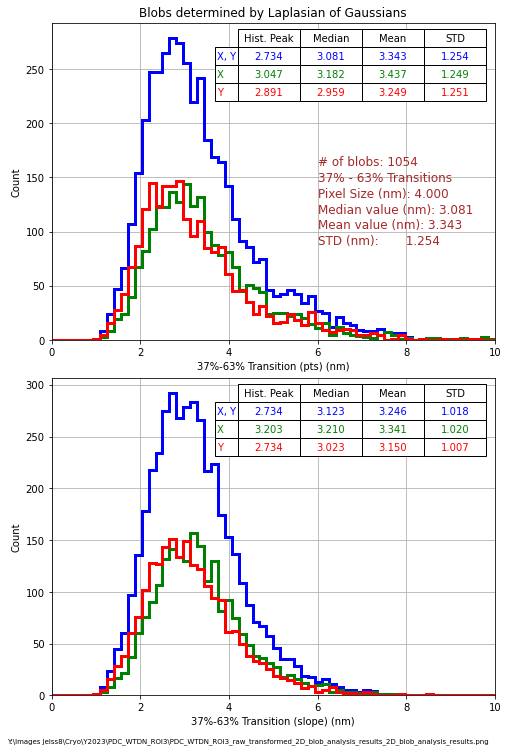

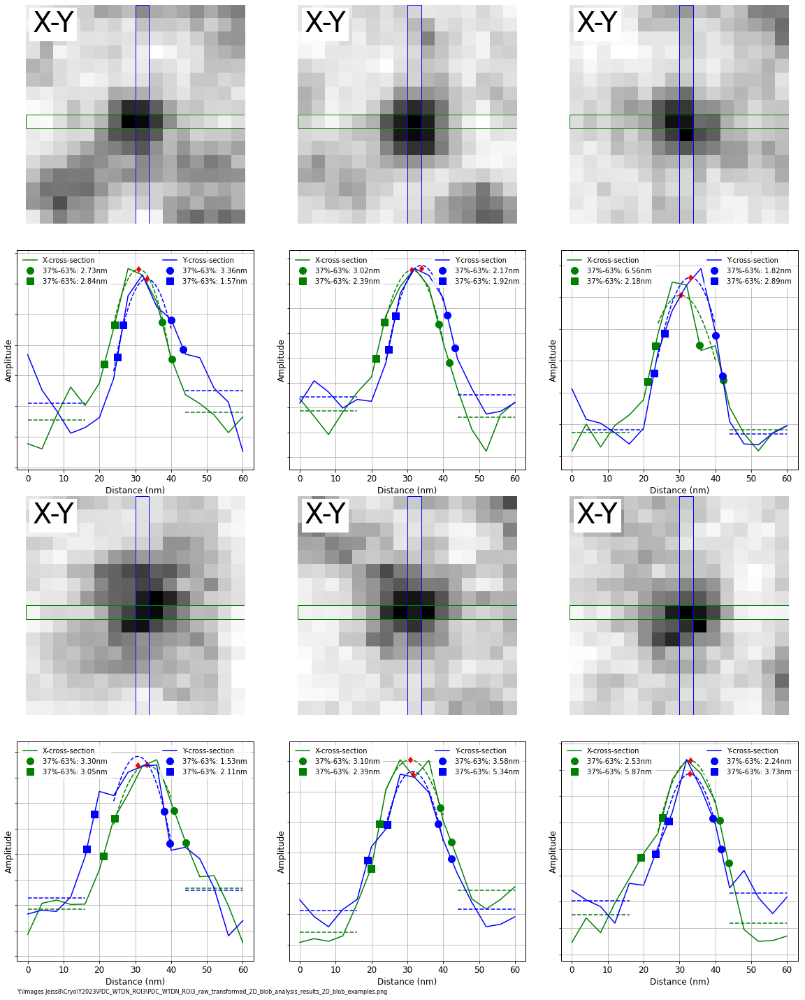

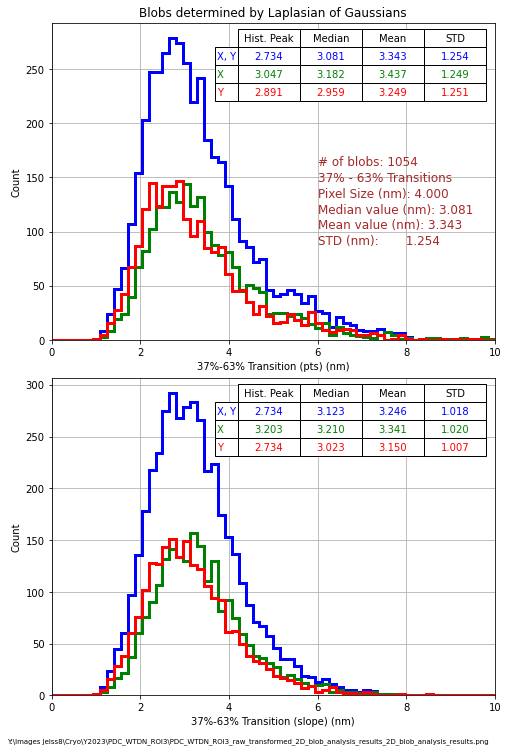

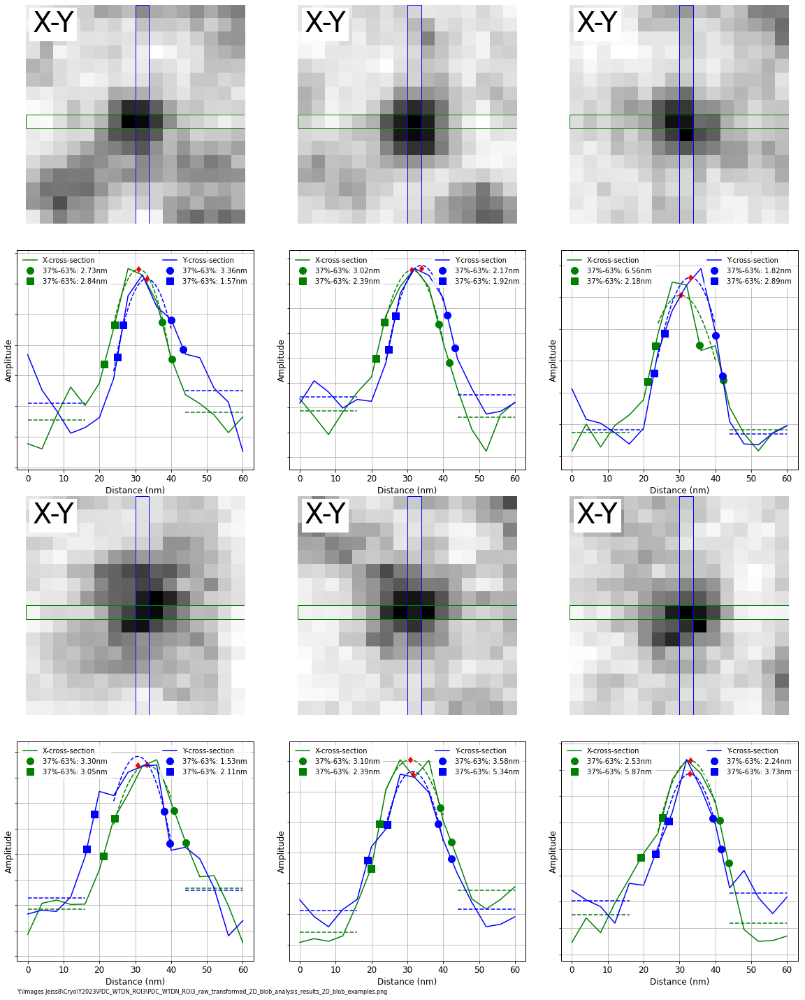

In [40]:
%%time

min_sigma = 1.0          # sigma (in pixel units) for Gaussian kernel in LoG search
max_sigma = 1.5          # sigma (in pixel units) for Gaussian kernel in LoG search
#threshold = 6000        # threshold for LoG search. The absolute lower bound for scale space maxima. Local maxima smaller
                         # than threshold are ignored. Reduce this to detect blobs with less intensities
overlap = 0.1            # A value between 0 and 1. If the area of two blobs overlaps by a fraction greater than 'overlap', the smaller blob is eliminated.
pixel_size = 4.0         #  pixel size in nm
subset_size = 16         #  subset size (pixels) for blob / transition analysis
bounds = [0.37, 0.63]    #  List of of transition limits
bands = [5, 5, 5]        # list of three ints for the averaging bands for determining the left min, peak, and right min of the cross-section profile.
min_thr = 0.4            # threshold for identifying a 'good' transition (bottom < min_thr* top)

perform_transformation = True

if perform_transformation:
    results_file_xlsx =os.path.join(data_dir, os.path.splitext(test_dataset.fnm_reg)[0]+'_transformed_2D_blob_analysis_results.xlsx')
else:
    results_file_xlsx =os.path.join(data_dir, os.path.splitext(test_dataset.fnm_reg)[0]+'_raw_2D_blob_analysis_results.xlsx')

results = test_dataset.estimate_resolution_blobs_2D(DASK_client=client,
                                                    image_name='ImageA',
                                               frame_inds = inds,
                                               evaluation_box=evaluation_box,
                                              min_sigma = min_sigma,
                                              max_sigma = max_sigma,
                                              threshold = threshold,
                                              overlap = overlap,
                                              pixel_size = pixel_size,
                                              subset_size = subset_size,
                                              bounds = bounds,
                                              bands = bands,
                                              min_thr = min_thr,
                                              title = fls[inds[0]],
                                              verbose = False,
                                              disp_res = False,
                                              perform_transformation = perform_transformation,
                                              save_data_xlsx =True,
                                              results_file_xlsx = results_file_xlsx)

print('Finished computations, generating reports')

results_file_xlsx, frame_inds, error_flags, blobs_LoG, tr_results = results
save_fname1 = results_file_xlsx.replace('.xlsx', '_2D_blob_analysis_results.png')
plot_2D_blob_results(results_file_xlsx, save_png=True, save_fname=save_fname1)
save_fname2 = results_file_xlsx.replace('.xlsx', '_2D_blob_examples.png')
plot_2D_blob_examples(results_file_xlsx, save_png=True, save_fname=save_fname2)

plot_2D_blob_results(results_file_xlsx, save_png=True, save_fname=save_fname1)
plot_2D_blob_examples(results_file_xlsx, save_png=True, save_fname=save_fname2)

# Destreak and Smooth the Data

array([ 656.87109375, 4180.12890625])

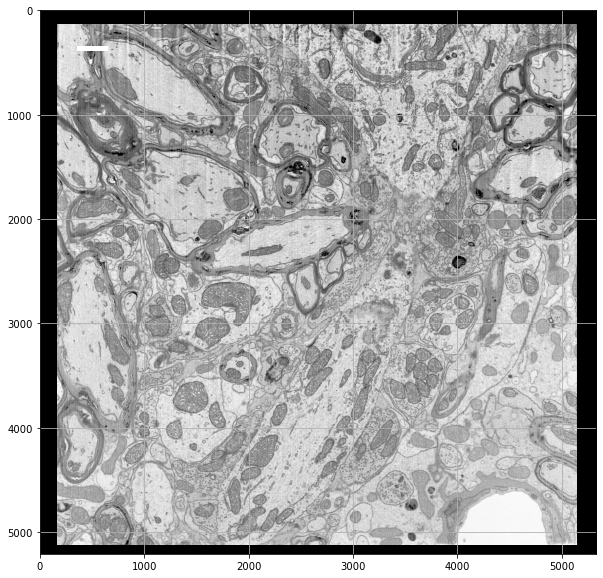

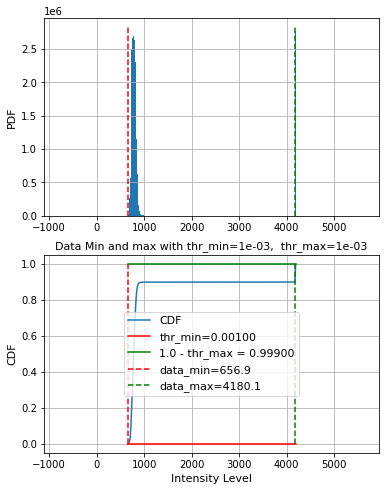

In [41]:
orig_mrc = os.path.normpath('Y:\Images Jeiss8\Cryo\Y2023\PDC_WTDN_ROI3\PDC_WTDN_ROI3_4x4x4nm.mrc')

mrc_obj = mrcfile.mmap(orig_mrc, mode='r', permissive=True)
header = mrc_obj.header
'''
    mode 0 -> uint8
    mode 1 -> int16
    mode 2 -> float32
    mode 4 -> complex64
    mode 6 -> uint16
'''
mrc_mode = mrc_obj.header.mode
test_frame_ind = 4000
test_frame = mrc_obj.data[test_frame_ind, :, :]
mrc_obj.close()

vmin, vmax = get_min_max_thresholds(test_frame[200: -200, 200: -200], disp_res=False)
fig, ax = plt.subplots(1,1, figsize=(10, 10))
ax.imshow(test_frame, cmap='Greys', vmin=vmin, vmax=vmax)
ax.grid(True)
#ax.axis(False)
#ax.axis(False)
add_scale_bar(ax, pixel=0.004, bar_length=5.0, bar_width=5, bar_label='')

get_min_max_thresholds(test_frame)

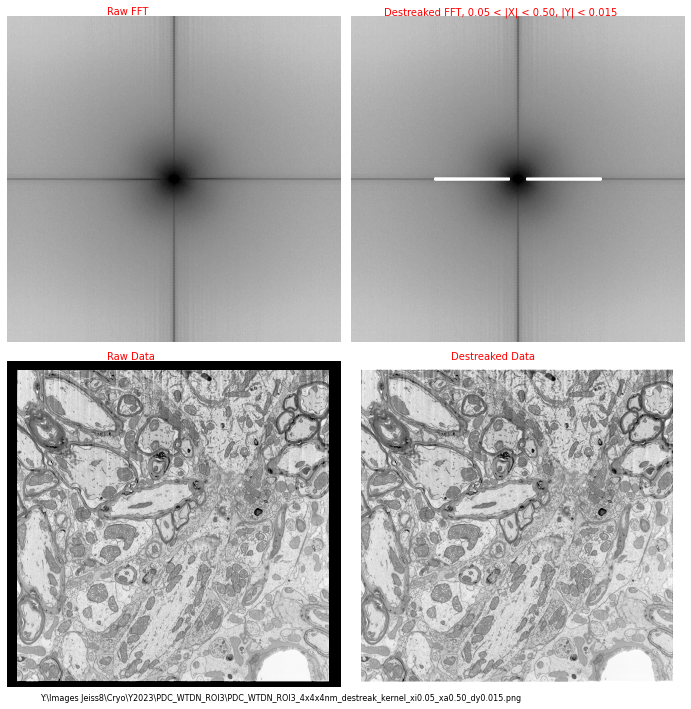

In [42]:
# define the destreak_kernel and estimate the performance

destreak_kernel_XY = True

if destreak_kernel_XY:   # destreaking isperformed by zeroing FFT data inside two symmetric bands along X-axis in FFT space
    xstart = 0.05
    xstop = 0.5
    dy = 0.015
else:                    # destreaking isperformed by zeroing FFT data inside angular segments FFT space (also limited in radial FFT coordinate)
    astart = -1.0
    astop = 1.0
    rstart = 0.05
    rstop = 0.5
    symmetry = 2

data_min = 500
data_max = 1500

clip_mask = (test_frame>data_min)*(test_frame<data_max)
ny, nx = np.shape(clip_mask)
try:
    yi = np.min(np.where(clip_mask[:, nx//2]))
except:
    yi = 0
try:
    ya = ny-np.max(np.where(clip_mask[:, nx//2]))
except:
    ya = 1
try:
    xi = np.min(np.where(clip_mask[ny//2, :]))
except:
    xi = 0
try:
    xa = nx-np.max(np.where(clip_mask[ny//2, :]))
except:
    xa = 1
pad_width = np.max((xi, xa, yi, ya))
padded_fr = clip_mask*test_frame + (1-clip_mask)*np.pad(test_frame[pad_width:-pad_width, pad_width:-pad_width], pad_width = pad_width, mode='symmetric')
img_fft = fftshift(fftn(ifftshift(padded_fr)))

if destreak_kernel_XY:
    destreak_kernel = build_kernel_FFT_zero_destreaker_XY(img_fft,
                                                          xstart=xstart,
                                                          xstop=xstop,
                                                          dy = dy)

else:
    destreak_kernel = build_kernel_FFT_zero_destreaker_radii_angles(img_fft,
                                       astart = astart,
                                       astop = astop,
                                       rstart=rstart,
                                       rstop=rstop,
                                       symm=symmetry)
    
st = 1.0/np.sqrt(2.0)
kernel = np.array([[st, 1.0, st],[1.0,1.0,1.0], [st, 1.0, st]]).astype(float)
smooth_kernel = kernel/kernel.sum()

data_FT_abs = np.log(np.abs(img_fft))
vmin_FFT, vmax_FFT = get_min_max_thresholds(data_FT_abs, disp_res=False)

data_FT_abs_zr = data_FT_abs * destreak_kernel

params = [orig_mrc, type(test_frame[0, 0]), test_frame_ind, test_frame_ind, data_min, data_max]
j, destreaked_frame = destreak_single_frame_kernel_shared(destreak_kernel, params)

sx = 10
sy = sx * ny // nx + 1.5

fig, axs = plt.subplots(2,2, figsize=(sx, sy))
fig.subplots_adjust(left=0.03, bottom=0.07, right=0.97, top=0.97, wspace=0.03, hspace=0.03)

axs[0, 0].imshow(data_FT_abs, cmap='Greys', vmin=vmin_FFT, vmax=vmax_FFT)
axs[0, 0].text(0.3, 1.005, 'Raw FFT', color='red', transform=axs[0, 0].transAxes, fontsize=10)

if destreak_kernel_XY:
    lim_str1 = '{:.2f} < |X| < {:.2f}, |Y| < {:.3f}'.format(xstart, xstop, dy)
    lim_str2 = '_xi{:.2f}_xa{:.2f}_dy{:.3f}.png'.format(xstart, xstop, dy)
else:
    lim_str1 = '{:.1f} < α < {:.1f}, {:.2f} < R < {:.2f}, symm={:d}'.format(astart, astop, rstart, rstop, symmetry)
    lim_str2 = '_ai{:.1f}_aa{:.1f}_ri{:.2f}_ra{:.2f}_symm{:d}.png'.format(astart, astop, rstart, rstop, symmetry)

axs[0, 1].imshow(data_FT_abs_zr, cmap='Greys', vmin=vmin_FFT, vmax=vmax_FFT)
axs[0, 1].text(0.1, 1.005, 'Destreaked FFT, '+lim_str1, color='red', transform=axs[0, 1].transAxes, fontsize=10)

vmin_ds, vmax_ds = get_min_max_thresholds(destreaked_frame[200: -200, 200: -200], disp_res=False)
axs[1, 1].imshow(destreaked_frame, cmap='Greys', vmin=vmin_ds, vmax=vmax_ds)
axs[1, 1].text(0.3, 1.005, 'Destreaked Data', color='red', transform=axs[1, 1].transAxes, fontsize=10)

axs[1, 0].imshow(test_frame, cmap='Greys', vmin=vmin, vmax=vmax, zorder=10)
axs[1, 0].text(0.3, 1.005, 'Raw Data', color='red', transform=axs[1,0].transAxes, fontsize=10)

for ax in ravel(axs):
    ax.axis(False)

save_png_name = orig_mrc.replace('.mrc', '_destreak_kernel'+lim_str2)
axs[1, 1].text(0.1, -0.04, save_png_name, transform=axs[1, 0].transAxes, fontsize=8)
fig.savefig(save_png_name, dpi=600)

In [43]:
%%time
destreaked_mrc = orig_mrc.replace('.mrc', '_destreaked.mrc')
saved_destreak_filename =  destreak_mrc_stack_with_kernel(orig_mrc,
                                                           destreak_kernel,
                                                           data_min, data_max,
                                                           DASK_client = client,
                                                           save_filename = destreaked_mrc)
print('Destreaked data saved into: ', saved_destreak_filename)

DASK client exists. Will perform distributed computations
Use http://localhost:8787/status to monitor DASK progress
Source mrc_mode: 1, source data type: <class 'numpy.int16'>
Source Data Shape:  5334 x 5208 x 5058
Source Voxel Size (Angstroms): 39.999279 x 39.999279 x 36.826321
Result mrc_mode: 1, source data type: <class 'numpy.int16'>
New Data Shape:  5334 x 5208 x 5058
Result Voxel Size (Angstroms): 39.999279 x 39.999279 x 36.826321


Creating params list:   0%|          | 0/5058 [00:00<?, ?it/s]

Using DASK distributed
Destreaked data saved into:  Y:\Images Jeiss8\Cryo\Y2023\PDC_WTDN_ROI3\PDC_WTDN_ROI3_4x4x4nm_destreaked.mrc
Wall time: 2h 32min 53s


In [44]:
%%time
mrc_destreaked_binned = destreaked_mrc.replace('.mrc', '_binned_4x.mrc')
bin_crop_mrc_stack(destreaked_mrc,
                    DASK_client = client,
                    xbin_factor = 4,
                    ybin_factor = 4,
                    zbin_factor = 4,
                    #fnm_types = ['mrc', 'h5'],
                    binned_copped_filename = mrc_destreaked_binned)

DASK client exists. Will perform distributed computations
Use http://localhost:8787/status to monitor DASK progress
Source mrc_mode: 1, source data type: <class 'numpy.int16'>
Source Voxel Size (Angstroms): 39.999279 x 39.999279 x 36.826321
Result mrc_mode: 1, source data type: <class 'numpy.int16'>


Building Parameters Sets:   0%|          | 0/1265 [00:00<?, ?it/s]

New Data Set Shape:  1333 x 1302 x 1265
Result Voxel Size (Angstroms): 159.997116 x 159.997116 x 147.305283
Using DASK distributed
Wall time: 6min 56s


['Y:\\Images Jeiss8\\Cryo\\Y2023\\PDC_WTDN_ROI3\\PDC_WTDN_ROI3_4x4x4nm_destreaked_binned_4x.mrc']

EM cross-sections dimensions (um): [21.32761557 20.83162451 18.63411825]
Center coordinates (um): [10.66380779 10.41581226  9.31705912]


Loading EM Cross-sections Data:   0%|          | 0/3 [00:00<?, ?it/s]

X-Y cross-section loaded, dimensions (pixels): 1333 1302
X-Z cross-section loaded, dimensions (pixels): 1333 1265
Y-Z cross-section loaded, dimensions (pixels): 1302 1265


Determining EM data range:   0%|          | 0/3 [00:00<?, ?it/s]

Will use EM-data range: 706.7 - 950.0
Generating Cross-Section Images
Generating X-Y cross-section
Generating Y-Z cross-section
Generating X-Z cross-section
Saving image into:  Y:\Images Jeiss8\Cryo\Y2023\PDC_WTDN_ROI3\PDC_WTDN_ROI3_4x4x4nm_destreaked_binned_4x_crosssections.png


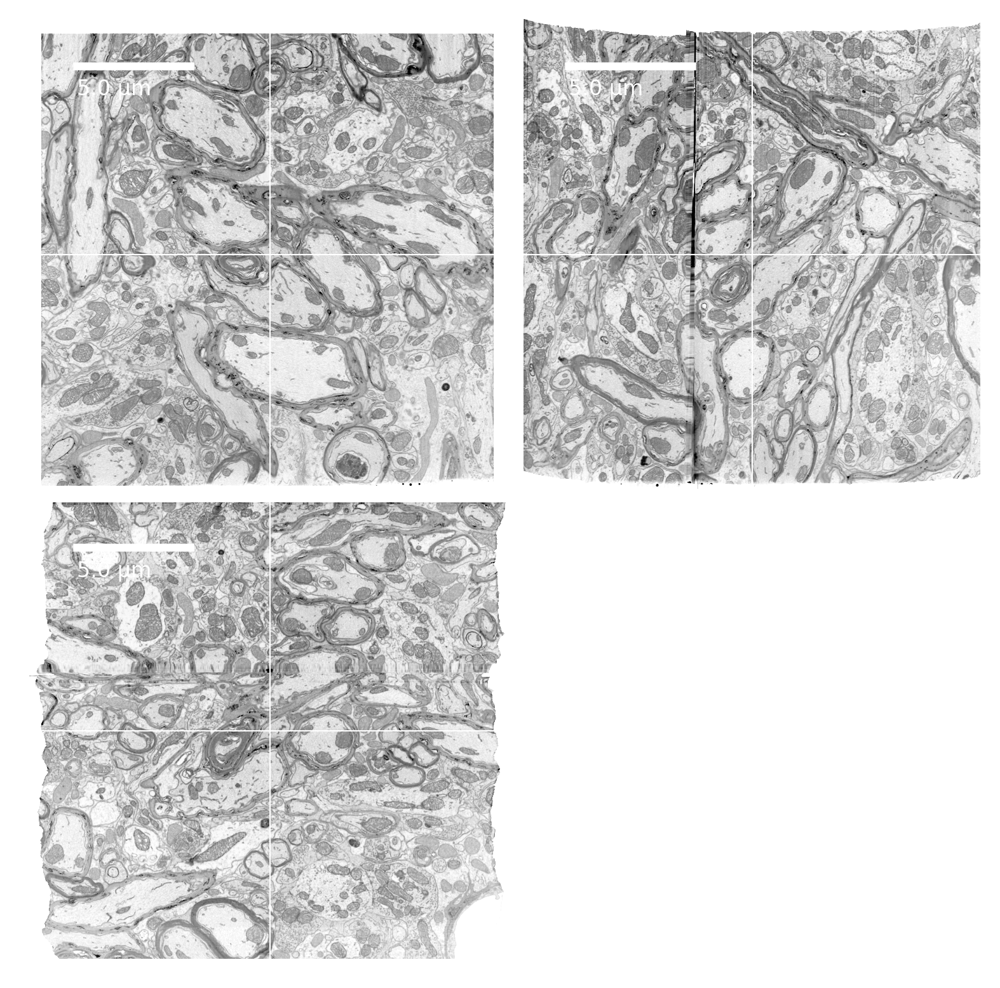

In [45]:
images, axs = plot_cross_sections_mrc_stack(mrc_destreaked_binned,
                                            bar_width = 3,
                                            bar_length_um = 5,
                                            label_offset = 30,
                                            label_font_size = 8.0,
                                            EM_max = 950, 
                                            dpi=300)

array([  0.     , 939.09375])

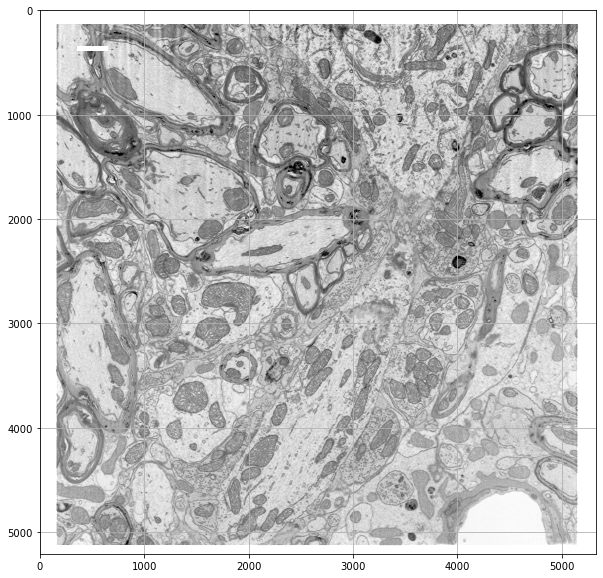

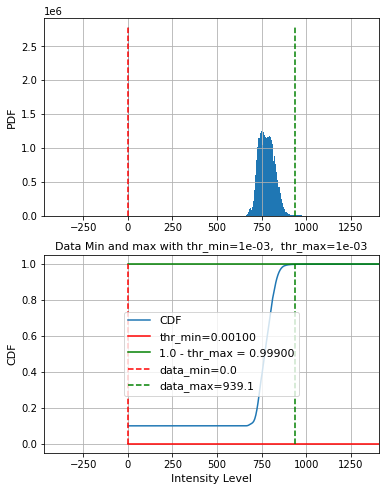

In [46]:
mrc_obj = mrcfile.mmap(destreaked_mrc, mode='r', permissive=True)
header = mrc_obj.header
'''
    mode 0 -> uint8
    mode 1 -> int16
    mode 2 -> float32
    mode 4 -> complex64
    mode 6 -> uint16
'''
mrc_mode = mrc_obj.header.mode
test_frame_ind = 4000
test_frame = mrc_obj.data[test_frame_ind, :, :]
mrc_obj.close()

vmin, vmax = get_min_max_thresholds(test_frame[200: -200, 200: -200], disp_res=False)
fig, ax = plt.subplots(1,1, figsize=(10, 10))
ax.imshow(test_frame, cmap='Greys', vmin=vmin, vmax=vmax)
ax.grid(True)
#ax.axis(False)
#ax.axis(False)
add_scale_bar(ax, pixel=0.004, bar_length=5.0, bar_width=5, bar_label='')

get_min_max_thresholds(test_frame)

In [47]:
%%time
st = 1.0/np.sqrt(2.0)
kernel = np.array([[st, 1.0, st],[1.0,1.0,1.0], [st, 1.0, st]]).astype(float)
smooth_kernel = kernel/kernel.sum()

smoothed_mrc = destreaked_mrc.replace('.mrc', '_smoothed.mrc')
data_min = 500
data_max = 1500
saved_smooth_filename =  smooth_mrc_stack_with_kernel(destreaked_mrc,
                                                           smooth_kernel,
                                                           data_min, data_max,
                                                           DASK_client = client,
                                                           save_filename = smoothed_mrc)
print('smoothed data saved into: ', saved_smooth_filename)

DASK client exists. Will perform distributed computations
Use http://localhost:8787/status to monitor DASK progress
Source mrc_mode: 1, source data type: <class 'numpy.int16'>
Source Data Shape:  5334 x 5208 x 5058
Source Voxel Size (Angstroms): 39.999279 x 39.999279 x 36.826321
Result mrc_mode: 1, source data type: <class 'numpy.int16'>
New Data Shape:  5334 x 5208 x 5058
Result Voxel Size (Angstroms): 39.999279 x 39.999279 x 36.826321


Creating params list:   0%|          | 0/5058 [00:00<?, ?it/s]

Using DASK distributed
smoothed data saved into:  Y:\Images Jeiss8\Cryo\Y2023\PDC_WTDN_ROI3\PDC_WTDN_ROI3_4x4x4nm_destreaked_smoothed.mrc
Wall time: 2h 31min 2s


In [48]:
%%time
mrc_smoothed_binned = smoothed_mrc.replace('.mrc', '_binned_4x.mrc')
bin_crop_mrc_stack(smoothed_mrc,
                    DASK_client = client,
                    xbin_factor = 4,
                    ybin_factor = 4,
                    zbin_factor = 4,
                    #fnm_types = ['mrc', 'h5'],
                    binned_copped_filename = mrc_smoothed_binned)

DASK client exists. Will perform distributed computations
Use http://localhost:8787/status to monitor DASK progress
Source mrc_mode: 1, source data type: <class 'numpy.int16'>
Source Voxel Size (Angstroms): 39.999279 x 39.999279 x 36.826321
Result mrc_mode: 1, source data type: <class 'numpy.int16'>


Building Parameters Sets:   0%|          | 0/1265 [00:00<?, ?it/s]

New Data Set Shape:  1333 x 1302 x 1265
Result Voxel Size (Angstroms): 159.997116 x 159.997116 x 147.305283
Using DASK distributed
Wall time: 6min 47s


['Y:\\Images Jeiss8\\Cryo\\Y2023\\PDC_WTDN_ROI3\\PDC_WTDN_ROI3_4x4x4nm_destreaked_smoothed_binned_4x.mrc']

EM cross-sections dimensions (um): [21.32761557 20.83162451 18.63411825]
Center coordinates (um): [10.66380779 10.41581226  9.31705912]


Loading EM Cross-sections Data:   0%|          | 0/3 [00:00<?, ?it/s]

X-Y cross-section loaded, dimensions (pixels): 1333 1302
X-Z cross-section loaded, dimensions (pixels): 1333 1265
Y-Z cross-section loaded, dimensions (pixels): 1302 1265


Determining EM data range:   0%|          | 0/3 [00:00<?, ?it/s]

Will use EM-data range: 707.9 - 950.0
Generating Cross-Section Images
Generating X-Y cross-section
Generating Y-Z cross-section
Generating X-Z cross-section
Saving image into:  Y:\Images Jeiss8\Cryo\Y2023\PDC_WTDN_ROI3\PDC_WTDN_ROI3_4x4x4nm_destreaked_smoothed_binned_4x_crosssections.png


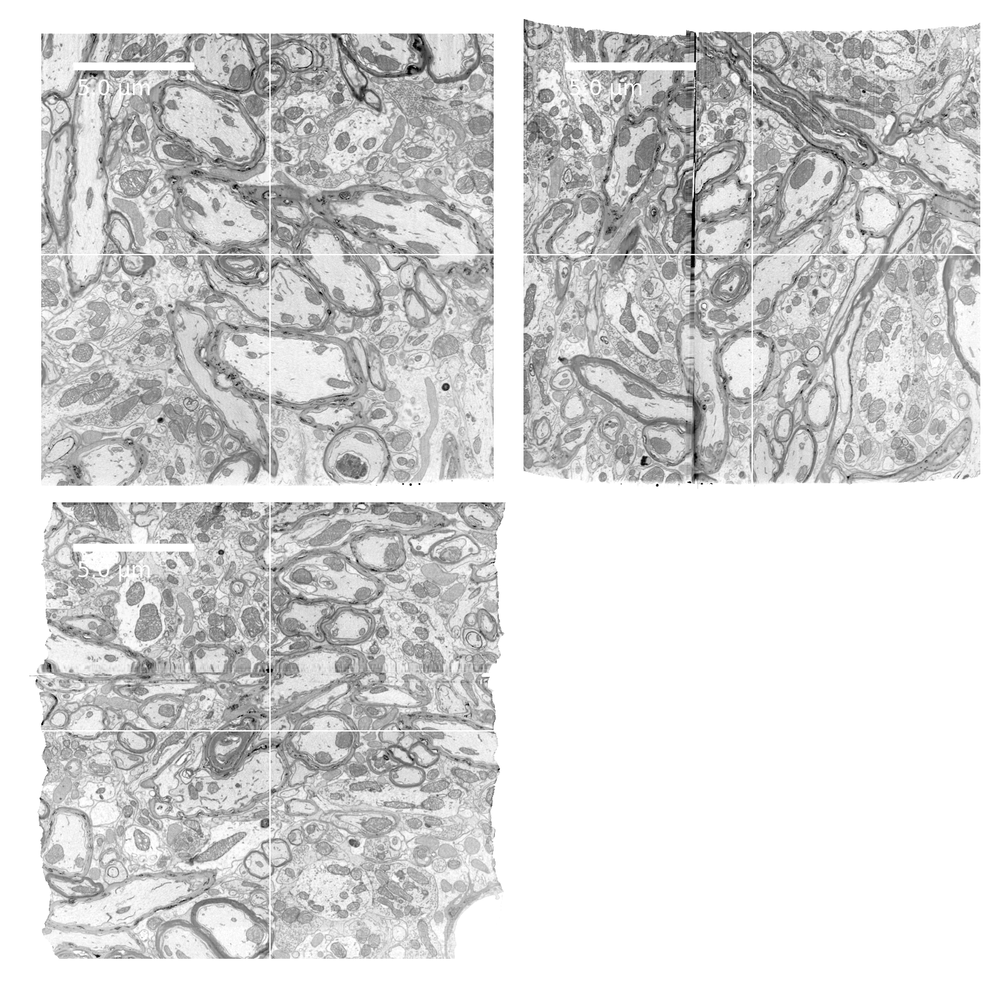

In [49]:
images, axs = plot_cross_sections_mrc_stack(mrc_smoothed_binned,
                                            bar_width = 3,
                                            bar_length_um = 5,
                                            label_offset = 30,
                                            label_font_size = 8.0,
                                            EM_max = 950, 
                                            dpi=300)